In [1]:
%matplotlib inline

In [2]:
from datetime import datetime
import os
from os.path import dirname, abspath, join
from os import getcwd
import sys

In [3]:
import random
import string
import pandas as pd
import numpy as np

In [4]:
np.set_printoptions(formatter={'float': '{: 0.3f}'.format})

In [5]:
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker

In [6]:
import torch
import socket
from IPython.display import clear_output

In [7]:
import itertools
import multiprocessing as mp

In [8]:
# seed_arg = int(sys.argv[1])
# print ("\n\nSeed ARG: ",seed_arg)
seed_arg = 0

In [9]:
seedlist = np.array([161, 314, 228, 271828, 230, 4271031, 5526538, 6610165, 9849252, 34534, 73422, 8765])
seed = seedlist[seed_arg]
random.seed(seed)
torch.manual_seed(seed)
torch.cuda.manual_seed(seed)
np.random.seed(seed)
os.environ['PYTHONHASHSEED'] = str(seed)

In [10]:
class ENO(object):
    
    #no. of forecast types is 6 ranging from 0 to 5
  
    def __init__(self, location='tokyo', year=2010, shuffle=False, day_balance=False):
        self.location = location
        self.year = year
        self.day = None
        self.hr = None
        
        self.shuffle = shuffle
        self.day_balance = day_balance

        self.TIME_STEPS = None #no. of time steps in one episode
        self.NO_OF_DAYS = None #no. of days in one year
        
        self.NO_OF_DAYTYPE = 10 #no. of daytypes
        self.daycounter = 0 #to count number of days that have been passed
        
        self.sradiation = None #matrix with GSR for the entire year
        self.senergy = None #matrix with harvested energy data for the entire year
        self.fforecast = None #array with forecast values for each day
        

        self.henergy = None #harvested energy variable
        self.fcast = None #forecast variable
        self.sorted_days = [] #days sorted according to day type
        
        self.SMAX = 1000 # 1 Watt Solar Panel

    
    #function to get the solar data for the given location and year and prep it
    def get_data(self):
        #solar_data/CSV files contain the values of GSR (Global Solar Radiation in MegaJoules per meters squared per hour)
        #weather_data/CSV files contain the weather summary from 06:00 to 18:00 and 18:00 to 06:00+1
        location = self.location
        year = self.year

        THIS_DIR = getcwd()
        SDATA_DIR = abspath(join(THIS_DIR, 'solar_data'))  #abspath(join(THIS_DIR, '../../..', 'data'))
        
        sfile = SDATA_DIR + '/' + location +'/' + str(year) + '.csv'
        
        #skiprows=4 to remove unnecessary title texts
        #usecols=4 to read only the Global Solar Radiation (GSR) values
        solar_radiation = pd.read_csv(sfile, skiprows=4, encoding='shift_jisx0213', usecols=[4])
      
        #convert dataframe to numpy array
        solar_radiation = solar_radiation.values

        #convert missing data in CSV files to zero
        solar_radiation[np.isnan(solar_radiation)] = 0

        #reshape solar_radiation into no_of_daysx24 array
        solar_radiation = solar_radiation.reshape(-1,24)

        if(self.shuffle): #if class instatiation calls for shuffling the day order. Required when learning
            np.random.shuffle(solar_radiation) 
        self.sradiation = solar_radiation
        
        #GSR values (in MJ/sq.mts per hour) need to be expressed in mW
        # Conversion is accomplished by 
        # solar_energy = GSR(in MJ/m2/hr) * 1e6 * size of solar cell * efficiency of solar cell /(60x60) *1000 (to express in mW)
        # the factor of 2 in the end is assuming two solar cells
        self.senergy = 2*self.sradiation * 1e6 * (55e-3 * 70e-3) * 0.15 * 1000/(60*60)

        return 0
    
    #function to map total day radiation into type of day ranging from 0 to 5
    #the classification into day types is quite arbitrary. There is no solid logic behind this type of classification.
    
    def get_day_state(self,tot_day_radiation):
        bin_edges = np.array([0, 3.5, 6.5, 9.0, 12.5, 15.5, 18.5, 22.0, 25, 28])
        for k in np.arange(1,bin_edges.size):
            if (bin_edges[k-1] <= tot_day_radiation <= bin_edges[k]):
                day_state = k -1
                break
            else:
                day_state = bin_edges.size - 1
        return int(day_state)
    
    def get_forecast(self):
        #create a perfect forecaster.
        tot_day_radiation = np.sum(self.sradiation, axis=1) #contains total solar radiation for each day
        get_day_state = np.vectorize(self.get_day_state)
        self.fforecast = get_day_state(tot_day_radiation)
        
        #sort days depending on the type of day and shuffle them; maybe required when learning
        for fcast in range(0,6):
            fcast_days = ([i for i,x in enumerate(self.fforecast) if x == fcast])
            np.random.shuffle(fcast_days)
            self.sorted_days.append(fcast_days)
        return 0
    
    def reset(self,day=0): #it is possible to reset to the beginning of a certain day
        
        self.get_data() #first get data for the given year
        self.get_forecast() #calculate the forecast
        
        self.TIME_STEPS = self.senergy.shape[1]
        self.NO_OF_DAYS = self.senergy.shape[0]
        
        self.day = day
        self.hr = 0
        
        self.henergy = self.senergy[self.day][self.hr]
        self.fcast = self.fforecast[self.day]
        
        end_of_day = False
        end_of_year = False
        return [self.henergy, self.fcast, end_of_day, end_of_year]

    
    def step(self):
        end_of_day = False
        end_of_year = False
        if not(self.day_balance): #if daytype balance is not required
            if(self.hr < self.TIME_STEPS - 1):
                self.hr += 1
                self.henergy = self.senergy[self.day][self.hr] 
                self.fcast = self.fforecast[self.day]
            else:
                if(self.day < self.NO_OF_DAYS -1):
                    end_of_day = True
                    self.hr = 0
                    self.day += 1
                    self.henergy = self.senergy[self.day][self.hr] 
                    self.fcast = self.fforecast[self.day]
                else:
                    end_of_day = True
                    end_of_year = True

                    
        else: #when training, we want all daytypes to be equally represented for robust policy
              #obviously, the days are going to be in random order
            if(self.hr < self.TIME_STEPS - 1):
                self.hr += 1
                self.henergy = self.senergy[self.day][self.hr]
                self.fcast = self.fforecast[self.day]
            else:
                if(self.daycounter < self.NO_OF_DAYS -1):
                    end_of_day = True
                    self.daycounter += 1
                    self.hr = 0
                    daytype = random.choice(np.arange(0,self.NO_OF_DAYTYPE)) #choose random daytype
                    self.day = np.random.choice(self.sorted_days[daytype]) #choose random day from that daytype
                    self.henergy = self.senergy[self.day][self.hr] 
                    self.fcast = self.fforecast[self.day]
                else: 
                    end_of_day = True
                    end_of_year = True
                    self.daycounter = 0
        
        return [self.henergy, self.fcast, end_of_day, end_of_year]

In [11]:
class CAPM (object):
    def __init__(self,location='tokyo', year=2010, shuffle=False, trainmode=False):

        #all energy values i.e. BMIN, BMAX, BOPT, HMAX are in mWhr. Assuming one timestep is one hour
        
        self.BMIN = 0.0                #Minimum battery level that is tolerated. Maybe non-zero also
        self.BMAX = 10000.0            #Max Battery Level. May not necessarily be equal to total batter capacity [3.6V x 2500mAh]
        self.BOPT = 0.5 * self.BMAX    #Optimal Battery Level. Assuming 50% of battery is the optimum
        self.BLIM_LO = 0.15*self.BMAX
        self.BLIM_HI = 0.85*self.BMAX
        self.BSAFE_LO = 0.35*self.BMAX
        self.BSAFE_HI = 0.65*self.BMAX
        
        self.ENP_MARGIN = 0.3*self.BMAX

        
        self.HMIN = 0      #Minimum energy that can be harvested by the solar panel.
        self.HMAX = None   #Maximum energy that can be harvested by the solar panel. [500mW]
        
        self.DMAX = 500      #Maximum energy that can be consumed by the node in one time step. [~ 3.6V x 135mA]
        self.N_ACTIONS = 10  #No. of different duty cycles possible
        self.DMIN = self.DMAX/self.N_ACTIONS #Minimum energy that can be consumed by the node in one time step. [~ 3.6V x 15mA]
        
        self.binit = None     #battery at the beginning of day
        self.btrack = []      #track the battery level for each day
        self.v_btrack = []      #track the virtual battery level for each day

        self.atrack = []      #track the duty cycles for each day
        self.htrack = []      #track the harvested for each day
        self.batt = None      #battery variable
        self.enp = None       #enp at end of hr
        self.henergy = None   #harvested energy variable
        self.fcast = None     #forecast variable
        
        self.MUBATT = 0.6
        self.SDBATT = 0.02
        
        self.MUHENERGY = 0.5
        self.SDHENERGY = 0.2
        
        self.MUENP = 0
        self.SDENP = 0.02
        
        self.location  = location
        self.year      = year
        self.shuffle   = shuffle
        self.trainmode = trainmode
        self.eno       = None
        
        self.day_violation_flag = False
        self.violation_flag     = False
        self.violation_counter  = 0
        self.batt_full_counter  = 0
        self.batt_empty_counter = 0
        
        self.batt_violations    = 0

        self.NO_OF_DAYTYPE      = 10 #no. of daytypes
 
    def reset(self,day=0,batt=-1):
        henergy, fcast, day_end, year_end = self.eno.reset(day) #reset the eno environment
        self.violation_flag = False
        self.violation_counter = 0
        self.batt_violations = 0
        
        if(batt == -1):
            self.batt = self.BOPT
        else:
            self.batt = batt
            
        self.batt = np.clip(self.batt, self.BMIN, self.BMAX)
        self.binit = self.batt
        self.btrack = np.append(self.btrack, self.batt) #track battery levels
        self.v_btrack = np.append(self.v_btrack, self.batt) #track battery levels
#         self.enp = self.BOPT - self.batt
        self.enp = self.binit - self.batt #enp is calculated
        self.henergy = np.clip(henergy, self.HMIN, self.HMAX) #clip henergy within HMIN and HMAX
        self.fcast = fcast
        
        norm_batt    = self.batt    /self.BMAX
        norm_enp     = self.enp     /self.BMAX
        norm_henergy = self.henergy /self.HMAX
        norm_fcast   = self.fcast   /(self.NO_OF_DAYTYPE-1)
        c_state = [norm_batt, norm_enp, norm_henergy, norm_fcast] #continuous states

        reward = 0
        
        return [c_state, reward, day_end, year_end]
    
    def getstate(self): #query the present state of the system
        norm_batt    = self.batt    /self.BMAX
        norm_enp     = self.enp     /self.BMAX
        norm_henergy = self.henergy /self.HMAX
        norm_fcast   = self.fcast   /(self.NO_OF_DAYTYPE-1)
        c_state = [norm_batt, norm_enp, norm_henergy, norm_fcast] #continuous states

        return c_state
        
    
    #reward function
    def rewardfn(self):
        violation_penalty = 0
        bmean = self.v_btrack.mean()
        bdev = self.BOPT - bmean
        if np.abs(bdev) > (self.BOPT - 0.25*self.BMAX):
            reward = 1.5-np.abs(bdev)/self.BMAX*5
        else:
            reward = 2
#         reward = 2 - 20*np.abs(bdev)/self.BMAX
        if(self.day_violation_flag):
            violation_penalty += 3    #penalty for violating battery limits anytime during the day
        return (reward - violation_penalty)
    
    
    
    def step(self, action):
        day_end = False
        year_end = False
        self.violation_flag = False
        reward = 0
        self.atrack = np.append(self.atrack, action+1) #track duty cycles
        self.htrack = np.append(self.htrack, self.henergy)

#         action_var = np.abs(np.mean(self.atrack) - action)/9 #can vary from 0 to 1
#         reward += 0.25*(0.5 - action_var ) #reward penalizing high duty cycle variance [-0.5 to 0.5]*0.25
      
        action = np.clip(action, 0, self.N_ACTIONS-1) #action values range from (0 to N_ACTIONS-1)
        e_consumed = (action+1)*self.DMAX/self.N_ACTIONS   #energy consumed by the node
        
        
        self.batt += (self.henergy - e_consumed)
        
        v_batt = self.binit + self.htrack.sum() - self.atrack.sum()*self.DMAX/self.N_ACTIONS
        self.v_btrack = np.append(self.v_btrack, v_batt) #track battery levels
        
        if(self.batt <= self.BMIN or self.batt >= self.BMAX ):
                self.batt_violations += 1
        
        if(self.batt <= self.BMIN or self.batt >= self.BMAX ):
#         if(self.batt < self.BLIM_LO or self.batt > self.BLIM_HI ):
            self.violation_flag = True #penalty for violating battery limits everytime it happens
#             reward -= 2
#             if(self.batt < self.BLIM_LO): #battery depletion is more fatal than battery overflow
#                 reward -= 2

        if(self.batt <= self.BMIN ): 
            self.batt_empty_counter += 1
        if(self.batt >= self.BMAX ): 
            self.batt_full_counter  += 1

        if(self.violation_flag):
            if(self.day_violation_flag == False): #penalty for violating battery limits anytime during the day - triggers once everyday
                self.violation_counter += 1
                self.day_violation_flag = True
                
        #calculate ENP before clipping
#         self.enp = self.BOPT - self.batt
        self.enp = self.binit - self.batt
        
        self.batt = np.clip(self.batt, self.BMIN, self.BMAX) #clip battery values within permitted level
        self.btrack = np.append(self.btrack, self.batt) #track battery levels
        
        
        #proceed to the next time step
       
        self.henergy, self.fcast, day_end, year_end = self.eno.step()
        self.henergy = np.clip(self.henergy, self.HMIN, self.HMAX) #clip henergy within HMIN and HMAX
                        
        if(day_end): #if eno object flags that the day has ended then give reward
            reward += self.rewardfn()
            if (self.trainmode): #reset battery to optimal level if limits are exceeded when training
#                 self.batt = np.random.uniform(self.DMAX*self.eno.TIME_STEPS/self.BMAX,0.8)*self.BMAX
#                 if (self.violation_flag):
                if np.random.uniform() < HELP : #occasionaly reset the battery
                    self.batt = self.BOPT  
            
            self.day_violation_flag = False
            self.binit = self.batt #this will be the new initial battery level for next day
            self.btrack = [] #clear battery tracker
            self.v_btrack = [] #clear battery tracker
            self.atrack = [] #clear duty cycle tracker
            self.htrack = [] #clear henergy tracker
   
        norm_batt    = self.batt    /self.BMAX
        norm_enp     = self.enp     /self.BMAX
        norm_henergy = self.henergy /self.HMAX
        norm_fcast   = self.fcast   /(self.NO_OF_DAYTYPE-1)
        c_state = [norm_batt, norm_enp, norm_henergy, norm_fcast] #continuous states
        
        return [c_state, reward, day_end, year_end]

In [12]:
RNDM_STRING = ''.join(random.choices(string.ascii_uppercase + string.digits, k=8))# + datetime.now().strftime("_%H_%M_%S")

LOCATION       = 'tokyo'
NAME           = 'ENO_ECO_'+ RNDM_STRING+ '_'+datetime.now().strftime("_%H_%M_%S")+"_"
MODEL_FILENAME = './models/'+ NAME + '_' + str(seed) + '.pt'
print("\nMODEL : ", MODEL_FILENAME)
print("SEED  : ",seed_arg)
print("HOST  : ",socket.gethostname())
print("START : ",datetime.now())


MODEL :  ./models/ENO_ECO_STI6WR1Z__21_17_03__161.pt
SEED  :  0
HOST  :  0119c18907dc
START :  2019-06-22 21:17:03.336809


In [13]:
# Hyper Parameters
BATCH_SIZE          = 32
WT_DECAY            = None
LR                  = 1e-4          # learning rate
EPSILON             = 0.9           # greedy policy
GAMMA               = 0.99           # reward discount
LAMBDA              = 0.95          # parameter decay
TARGET_REPLACE_ITER = 24*7*4*18     # target update frequency
MEMORY_CAPACITY     = 24*7*4*12*3   # store upto six month worth of memory   

N_ACTIONS           = 10            # no. of duty cycles (0,1,2,3,4)
N_STATES            = 4             # number of state space parameter [batt, enp, henergy, fcast]

HIDDEN_LAYER        = 50            # width of NN
NN_ITERATIONS       = 500
GPU                 = False         # device
HELP                = 0.05
print("HYPERPARAMETERS")

HYPERPARAMETERS


In [14]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import numpy as np

#Class definitions for NN model and learning algorithm
class Net(nn.Module):
    def __init__(self):
        super(Net, self).__init__()

        self.fc1 = nn.Linear(N_STATES, HIDDEN_LAYER)
        nn.init.kaiming_uniform_(self.fc1.weight)

        self.adv = nn.Linear(HIDDEN_LAYER, N_ACTIONS)
        nn.init.xavier_uniform_(self.adv.weight) 
    
        self.val = nn.Linear(HIDDEN_LAYER, 1)
        nn.init.xavier_uniform_(self.val.weight)
        
    def forward(self, x):
        x = self.fc1(x)
        x = F.relu(x)

        adv = self.adv(x)
        val = self.val(x)
        
        return val + adv - adv.mean()
    
class DQN(object):
    def __init__(self):
        if(GPU): 
            device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
        else:
            device = torch.device('cpu')
        self.eval_net, self.target_net = Net(), Net()
        self.eval_net.to(device)
        self.target_net.to(device)
        self.device = device

        self.learn_step_counter = 0                                     # for target updating
        self.memory_counter = 0                                         # for storing memory
        self.memory = np.zeros((MEMORY_CAPACITY, N_STATES * 2 + 2))     # initialize memory [mem: ([s], a, r, [s_]) ]
        self.optimizer = torch.optim.Adam(self.eval_net.parameters(), lr=LR)

        self.running_loss = 0.0
        
        self.loss_func = nn.MSELoss()
        self.nettoggle = False

    
#     def choose_action(self, x):
#         x = torch.unsqueeze(torch.FloatTensor(x), 0)
#         x = x.to(self.device)

#         actions_value = self.eval_net.forward(x)
#         actions_value = actions_value.to(torch.device("cpu"))
#         action = torch.max(actions_value, 1)[1].data.numpy()
#         action = action[0] # return the argmax index
#         if np.random.uniform() > EPSILON:   # greedy
# #             action += np.random.randint(-3, 3)
# #             action = int(np.clip(action, 0, N_ACTIONS-1))
# #             action = np.random.randint(0,N_ACTIONS)
#             action = np.random.choice(np.arange(0, N_ACTIONS), p=[0.55, 0.05, 0.05, 0.05, 0.05, 0.05, 0.05, 0.05, 0.05, 0.05])

#         return action
    
    def choose_greedy_action(self, x):
        x = torch.unsqueeze(torch.FloatTensor(x), 0)
        x = x.to(self.device)

        actions_value = self.eval_net.forward(x)
        actions_value = actions_value.to(torch.device("cpu"))
        action = torch.max(actions_value, 1)[1].data.numpy().flatten()
        action = action[0] # return the argmax index
        
        return action

    def store_transition(self, s, a, r, s_):
        transition = np.hstack((s, [a, r], s_))
        # replace the old memory with new memory
        index = self.memory_counter % MEMORY_CAPACITY
        self.memory[index, :] = transition
        self.memory_counter += 1
    
    def store_day_transition(self, transition_rec):
        data = transition_rec
        index = self.memory_counter % MEMORY_CAPACITY
        self.memory= np.insert(self.memory, index, data,0)
        self.memory_counter += transition_rec.shape[0]

    def learn(self):
        # target parameter update
        if self.learn_step_counter % TARGET_REPLACE_ITER == 0:
            self.target_net.load_state_dict(self.eval_net.state_dict())
            self.nettoggle = not self.nettoggle
        self.learn_step_counter += 1

        # sample batch transitions
        sample_index_limit = min(MEMORY_CAPACITY, self.memory_counter)
        sample_index = np.random.choice(sample_index_limit, BATCH_SIZE)
#         sample_index = np.random.choice(MEMORY_CAPACITY, BATCH_SIZE)
        b_memory = self.memory[sample_index, :]
        b_s = torch.FloatTensor(b_memory[:, :N_STATES])
        b_a = torch.LongTensor(b_memory[:, N_STATES:N_STATES+1].astype(int))
        b_r = torch.FloatTensor(b_memory[:, N_STATES+1:N_STATES+2])
        b_s_ = torch.FloatTensor(b_memory[:, -N_STATES:])
        
        b_s = b_s.to(self.device)
        b_a = b_a.to(self.device)
        b_r = b_r.to(self.device)
        b_s_ = b_s_.to(self.device)

        # q_eval w.r.t the action in experience
        q_eval   = self.eval_net(b_s).gather(1, b_a)  # shape (batch, 1)
        a_eval   = self.eval_net(b_s).max(1)[1].view(BATCH_SIZE, 1) #best action according to eval_net
        q_next   = self.target_net(b_s_).detach()     # detach from graph, don't backpropagate
        q_target = b_r + GAMMA * q_next.gather(1, a_eval)   # shape (batch, 1)
        loss     = self.loss_func(q_eval, q_target)

        self.optimizer.zero_grad()
        loss.backward()
        self.optimizer.step()
        
        self.running_loss += loss.mean().item()
        if self.learn_step_counter % TARGET_REPLACE_ITER == 0:
            print('LOSS : %.3f' %(self.running_loss / TARGET_REPLACE_ITER))
            self.running_loss = 0.0

In [15]:
c_init      = CAPM()
c_init.eno  = ENO()
c_init.HMAX = c_init.eno.SMAX

In [16]:
# CONSTANTS
BMAX = c_init.BMAX
HMAX = c_init.HMAX

In [17]:
#DISCRETIZING LIMITS 

B_MAX = c_init.BMAX
B_MIN = 0

ENP_MAX =  c_init.BMAX
ENP_MIN = -c_init.BMAX

H_MAX =  c_init.HMAX
H_MIN =  0

F_MAX = c_init.NO_OF_DAYTYPE - 1
F_MIN = 0

In [18]:
def normalize(s):
    normalizer = np.array([BMAX, BMAX, HMAX, F_MAX])
    return s/normalizer[None,:]        

In [19]:
def denormalize(s):
    normalizer = np.array([BMAX, BMAX, HMAX, F_MAX])
    return s*normalizer[None,:]    

In [20]:
def stdize(s):
    MU_BATT = 0.5
    SD_BATT = 0.5
    
    MU_ENP = 0
    SD_ENP = 0.5
    
    MU_HENERGY = 0.35
    SD_HENERGY = 0.55
    
    MU_FCAST = 0.5
    SD_FCAST = 0.6
    
    norm_batt, norm_enp, norm_henergy, norm_fcast = s
    
    std_batt    = (norm_batt    - MU_BATT    )/SD_BATT
    std_enp     = (norm_enp     - MU_ENP     )/SD_ENP
    std_henergy = (norm_henergy - MU_HENERGY )/SD_HENERGY
    std_fcast   = (norm_fcast   - MU_FCAST   )/SD_FCAST

    return [std_batt, std_enp, std_henergy, std_fcast]

In [21]:
def batch_stdize(s):
    MU_BATT = 0.5
    SD_BATT = 0.5
    
    MU_ENP = 0
    SD_ENP = 0.5
    
    MU_HENERGY = 0.35
    SD_HENERGY = 0.55
    
    MU_FCAST = 0.5
    SD_FCAST = 0.6
     
    MU = np.array([MU_BATT, MU_ENP, MU_HENERGY, MU_FCAST])
    SD = np.array([SD_BATT, SD_ENP, SD_HENERGY, SD_FCAST])
        
    X = s - MU[None, :]
    return X/SD[None,:]

def batch_destdize(s):
    MU_BATT = 0.5
    SD_BATT = 0.5
    
    MU_ENP = 0
    SD_ENP = 0.5
    
    MU_HENERGY = 0.35
    SD_HENERGY = 0.55
    
    MU_FCAST = 0.5
    SD_FCAST = 0.6
     
    MU = np.array([MU_BATT, MU_ENP, MU_HENERGY, MU_FCAST])
    SD = np.array([SD_BATT, SD_ENP, SD_HENERGY, SD_FCAST])
        
    X = s*SD[None, :]
    return X + MU[None,:]

In [22]:
NO_OF_NODES = 10
LOCATION = 'tokyo'
my_capm = None
my_dqn = DQN()

# capm_list = []
# for i in range(NO_OF_NODES):
#     yr = i
#     dummy = CAPM(LOCATION, yr)
#     dummy.eno = ENO(LOCATION, yr)
#     dummy.HMAX = dummy.eno.SMAX
#     dummy.reset()
#     capm_list.append(dummy)

In [23]:
CAPM_QUEUE =  mp.Queue()
for node_id in range(0,NO_OF_NODES):
    yr = 2000
    dummy = CAPM(LOCATION, yr)
    dummy.eno = ENO(LOCATION, yr)
    dummy.HMAX = dummy.eno.SMAX
    dummy.reset()
    CAPM_QUEUE.put(dummy)

In [24]:
def init_T_ENO(q):
    global my_capm
    global my_dqn
    my_capm = q.get()    

In [25]:
def T_ENO(node_id,day,sc_EPSILON, param_file):
    global my_capm
    global my_dqn
    my_dqn.eval_net.load_state_dict(torch.load(param_file))
    my_dqn.eval_net.eval()
    np.random.seed(node_id+day)
    my_EPSILON = sc_EPSILON
    experience_record = np.empty((my_capm.eno.TIME_STEPS ,N_STATES * 2 + 2))
    
    my_capm.eno.hr = 0
    s = my_capm.getstate()
    
    my_prob = [0.05, 0.05, 0.05, 0.05, 0.05, 0.05, 0.05, 0.05, 0.05, 0.05]
    my_prob[int(node_id)] += 0.5
    while True:
        
        if np.random.uniform() > my_EPSILON:
#             a = np.random.randint(0,N_ACTIONS)
            a = np.random.choice(np.arange(0, N_ACTIONS), p=my_prob)
        else:
            a = my_dqn.choose_greedy_action(stdize(s))

        
        # take action
        s_, r, day_end, year_end = my_capm.step(a)

        # store experience   
        experience_record[int(my_capm.eno.hr-1)] = np.hstack((stdize(s), [a, r], stdize(s_)))

        s = s_
        
        if day_end:
            experience_record[:,N_STATES + 1]  = r
            break
            
    experience_record = experience_record.flatten().reshape(-1,N_STATES * 2 + 2)
    terminal_reward = experience_record[-1,5]
    
    
    return [experience_record, terminal_reward, my_capm.batt_empty_counter, my_capm.batt_full_counter, node_id, my_capm.year, my_EPSILON]

In [26]:
dqn = DQN()
torch.save(dqn.eval_net.state_dict(), MODEL_FILENAME)
dqn.eval_net.eval()
pool = mp.Pool(processes=NO_OF_NODES, initializer=init_T_ENO, initargs=(CAPM_QUEUE,))

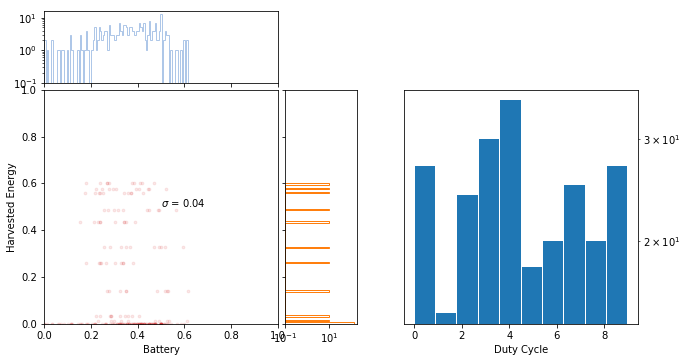

DAY: 0
REWARDS:  [ 2.000  2.000  2.000  2.000  2.000  2.000  2.000 -1.000 -2.832 -2.859]
EPSILON : [ 0.100  0.100  0.100  0.100  0.100  0.100  0.100  0.100  0.100  0.100]
MEMORY:  240

CHECKING... 


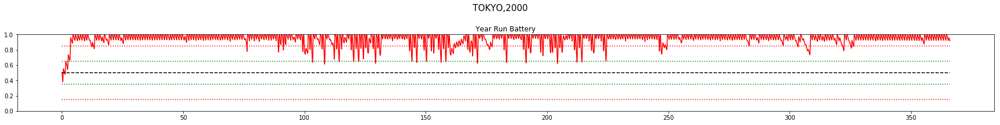

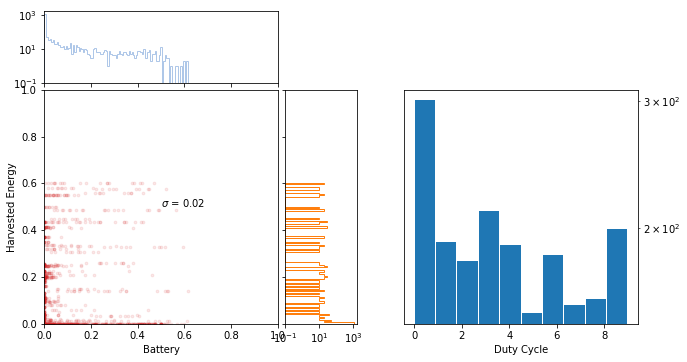

DAY: 7
REWARDS:  [-4.585 -4.679 -4.735 -5.050 -4.877 -5.224 -5.289 -5.457 -5.387 -5.347]
EPSILON : [ 0.135  0.135  0.135  0.135  0.135  0.135  0.135  0.135  0.135  0.135]
MEMORY:  1920

CHECKING... 


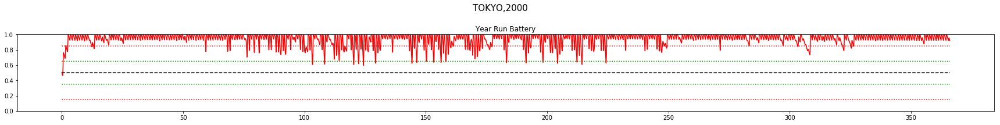

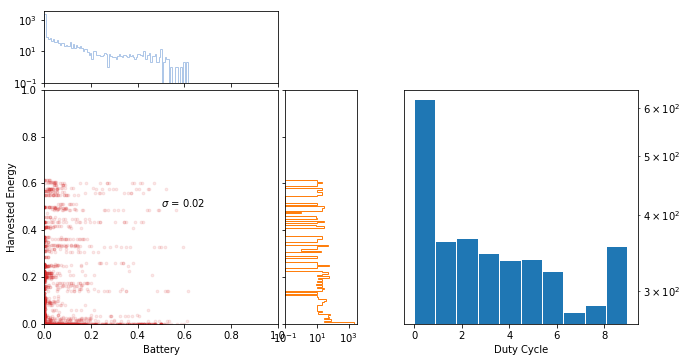

DAY: 14
REWARDS:  [-4.214 -4.428 -4.145 -4.545 -4.816 -4.807 -5.213 -5.161 -5.591 -5.519]
EPSILON : [ 0.170  0.170  0.170  0.170  0.170  0.170  0.170  0.170  0.170  0.170]
MEMORY:  3600

CHECKING... 


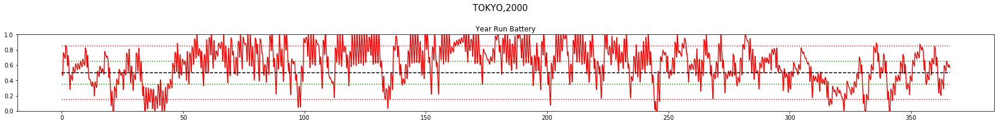

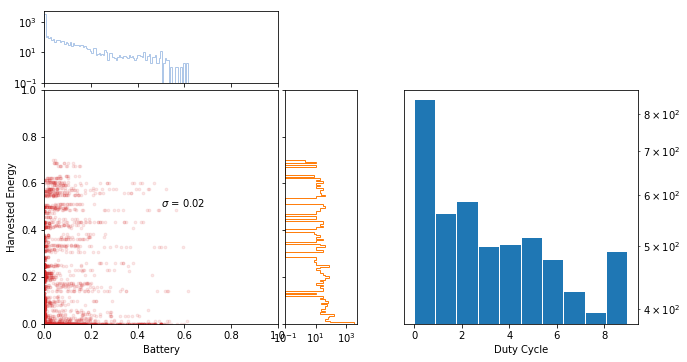

DAY: 21
REWARDS:  [-4.088 -4.185 -0.192 -4.515 -4.354 -4.714 -4.639 -5.004 -5.099 -4.891]
EPSILON : [ 0.205  0.205  0.205  0.205  0.205  0.205  0.205  0.205  0.205  0.205]
MEMORY:  5280

CHECKING... 


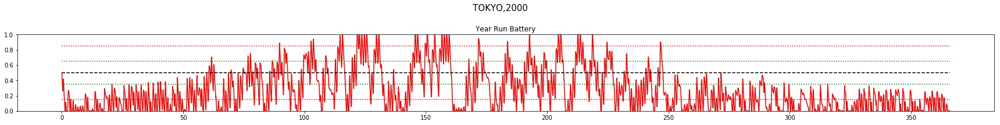

LOSS : 1.749


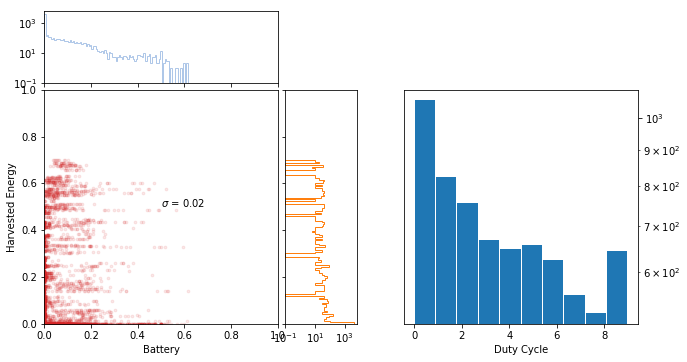

DAY: 28
REWARDS:  [-0.196 -3.827 -3.774 -4.292 -4.177 -4.558 -4.043 -4.103 -4.601 -4.845]
EPSILON : [ 0.240  0.240  0.240  0.240  0.240  0.240  0.240  0.240  0.240  0.240]
MEMORY:  6960

CHECKING... 


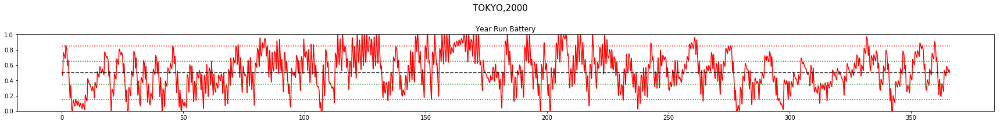

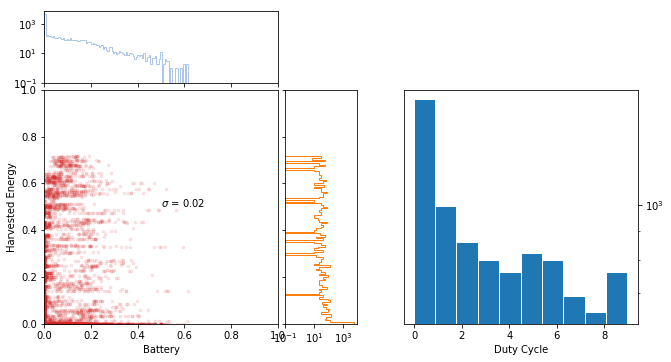

DAY: 35
REWARDS:  [-3.988 -3.316  0.043 -4.777 -5.081 -3.415 -3.907 -0.212 -4.375 -4.828]
EPSILON : [ 0.275  0.275  0.275  0.275  0.275  0.275  0.275  0.275  0.275  0.275]
MEMORY:  8640

CHECKING... 


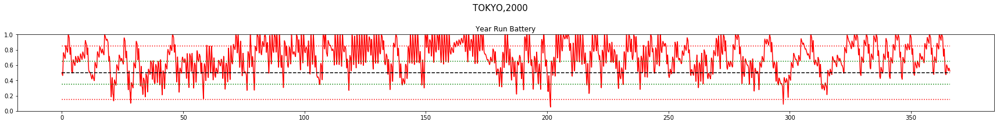

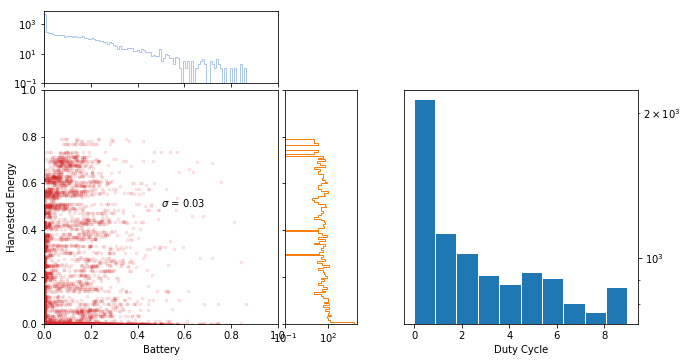

DAY: 42
REWARDS:  [-3.552  2.000 -0.060  2.000 -3.868  2.000  2.000 -4.483 -4.563 -4.231]
EPSILON : [ 0.310  0.310  0.310  0.310  0.310  0.310  0.310  0.310  0.310  0.310]
MEMORY:  10320

CHECKING... 


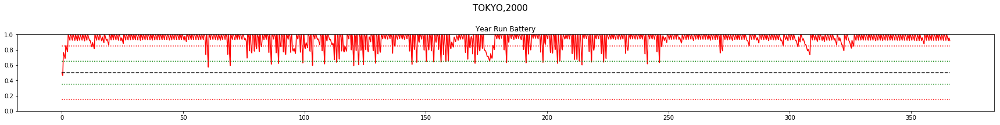

LOSS : 1.083


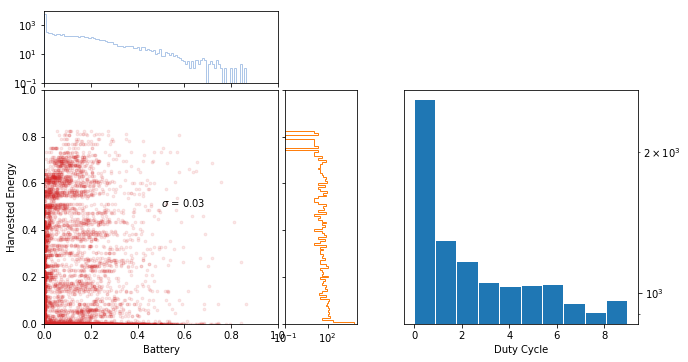

DAY: 49
REWARDS:  [-5.234 -3.592 -0.119 -4.355 -5.676  2.000 -3.409 -5.516 -5.450 -3.542]
EPSILON : [ 0.345  0.345  0.345  0.345  0.345  0.345  0.345  0.345  0.345  0.345]
MEMORY:  12000

CHECKING... 


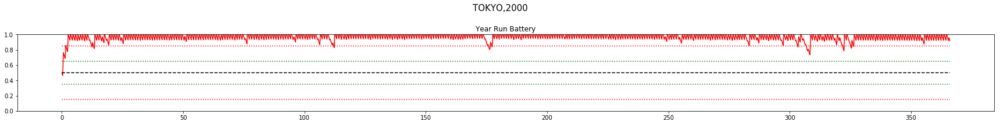

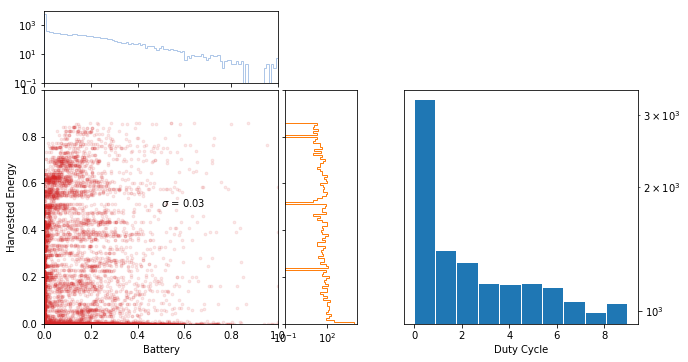

DAY: 56
REWARDS:  [ 2.000  0.115 -3.450 -3.917  2.000  2.000 -3.453  2.000 -3.531 -3.122]
EPSILON : [ 0.380  0.380  0.380  0.380  0.380  0.380  0.380  0.380  0.380  0.380]
MEMORY:  13680

CHECKING... 


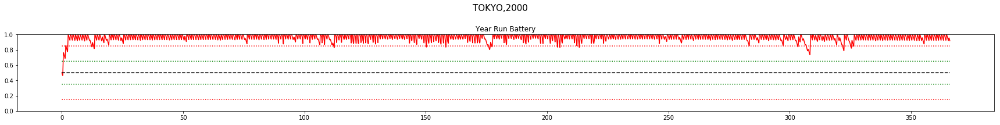

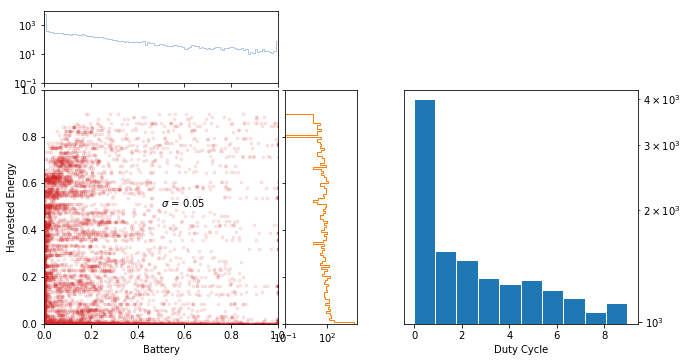

DAY: 63
REWARDS:  [-3.537 -3.962 -0.149  2.000 -4.078 -3.433  2.000  0.217  2.000  2.000]
EPSILON : [ 0.415  0.415  0.415  0.415  0.415  0.415  0.415  0.415  0.415  0.415]
MEMORY:  15360

CHECKING... 


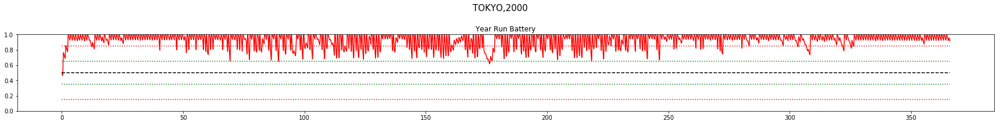

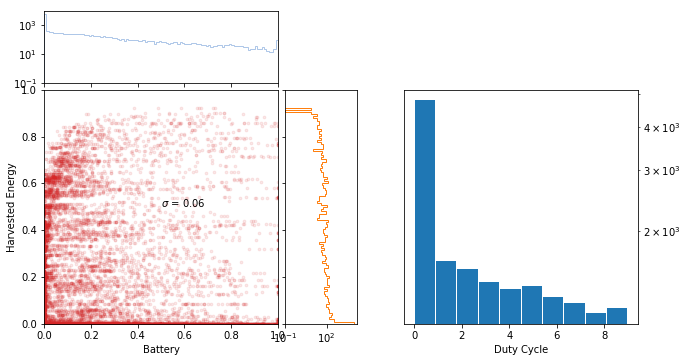

DAY: 70
REWARDS:  [ 2.000  2.000  2.000  2.000  2.000  2.000 -3.403  0.144  2.000  2.000]
EPSILON : [ 0.450  0.450  0.450  0.450  0.450  0.450  0.450  0.450  0.450  0.450]
MEMORY:  17040

CHECKING... 


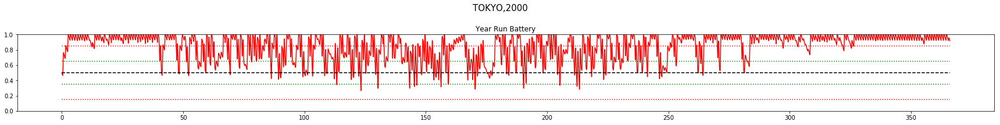

LOSS : 2.142


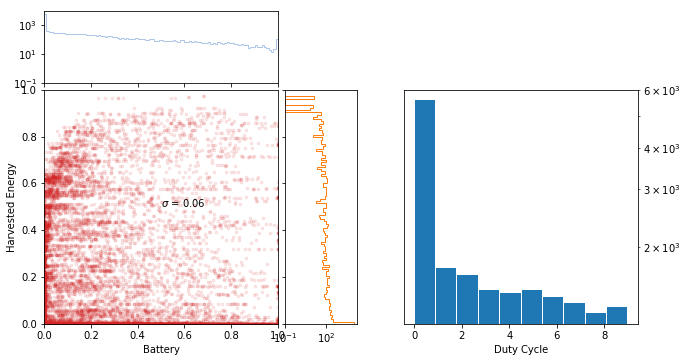

DAY: 77
REWARDS:  [ 0.024  2.000  2.000  2.000  2.000  2.000  2.000  0.189  2.000  2.000]
EPSILON : [ 0.485  0.485  0.485  0.485  0.485  0.485  0.485  0.485  0.485  0.485]
MEMORY:  18720

CHECKING... 


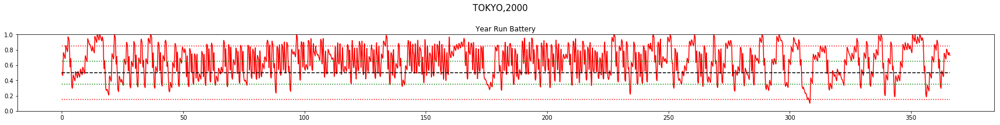

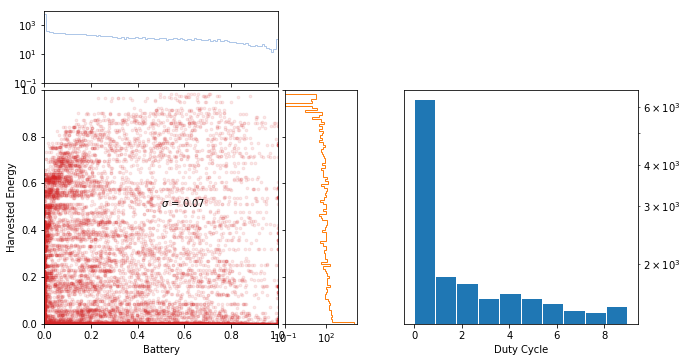

DAY: 84
REWARDS:  [ 2.000  2.000  2.000  2.000  2.000  2.000  2.000  2.000  2.000  2.000]
EPSILON : [ 0.520  0.520  0.520  0.520  0.520  0.520  0.520  0.520  0.520  0.520]
MEMORY:  20400

CHECKING... 


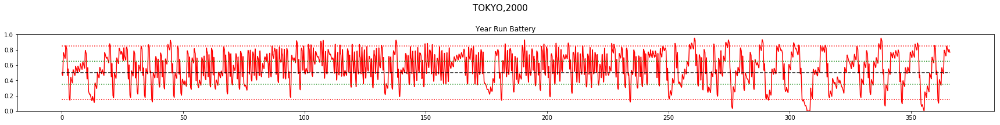

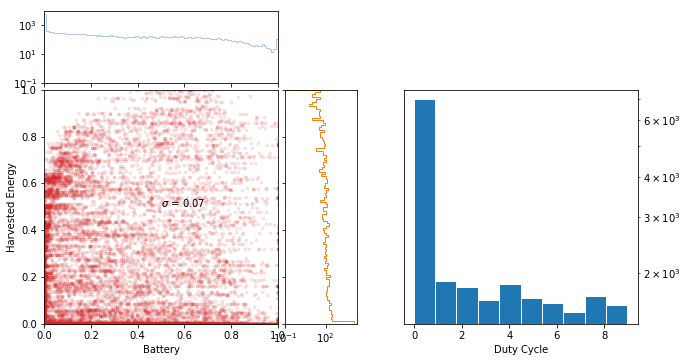

DAY: 91
REWARDS:  [ 2.000  2.000  2.000  2.000  2.000  2.000  2.000  2.000  2.000  2.000]
EPSILON : [ 0.555  0.555  0.555  0.555  0.555  0.555  0.555  0.555  0.555  0.555]
MEMORY:  22080

CHECKING... 


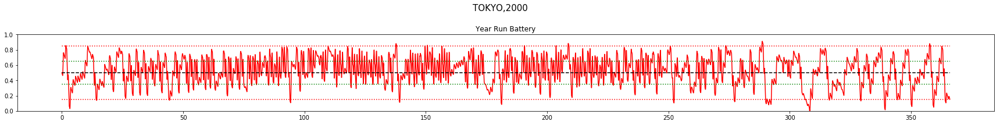

LOSS : 2.674


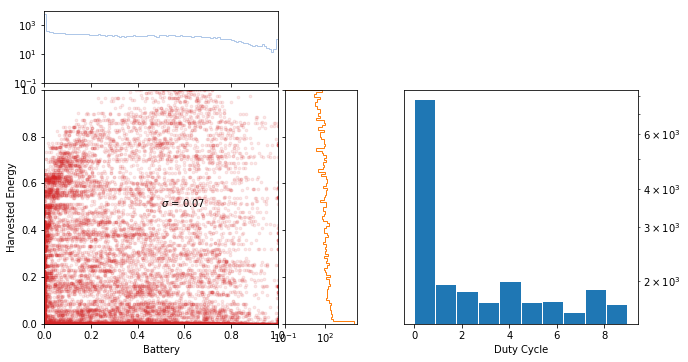

DAY: 98
REWARDS:  [ 2.000  2.000  2.000  2.000  2.000  2.000  2.000  2.000  2.000  2.000]
EPSILON : [ 0.590  0.590  0.590  0.590  0.590  0.590  0.590  0.590  0.590  0.590]
MEMORY:  23760

CHECKING... 


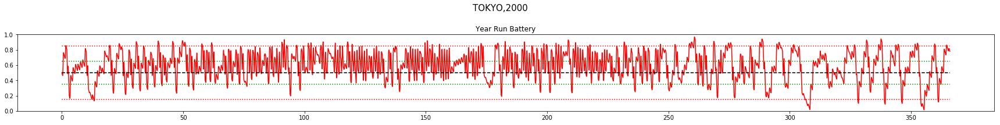

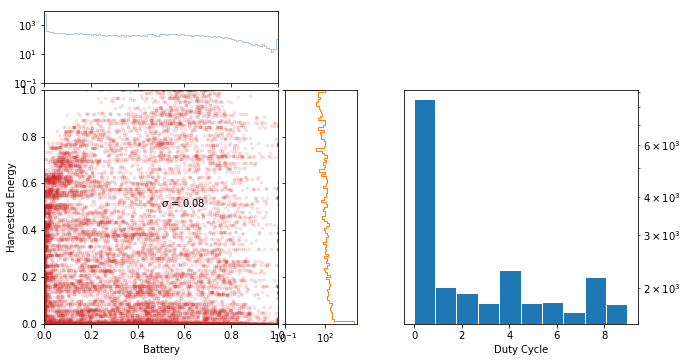

DAY: 105
REWARDS:  [ 2.000 -1.000  2.000  2.000  2.000  2.000  2.000  2.000  2.000  2.000]
EPSILON : [ 0.625  0.625  0.625  0.625  0.625  0.625  0.625  0.625  0.625  0.625]
MEMORY:  25440

CHECKING... 


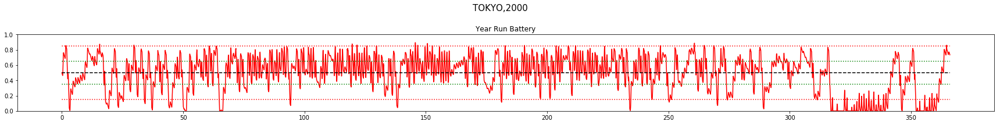

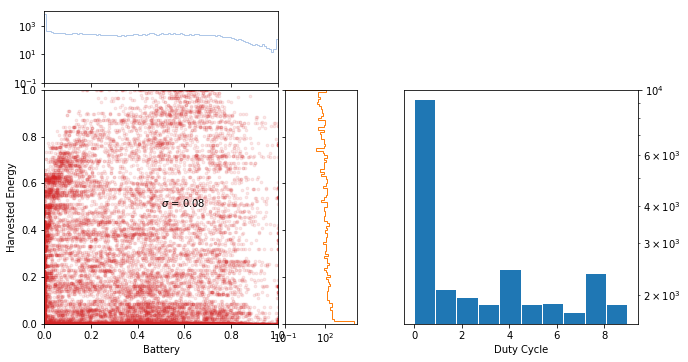

DAY: 112
REWARDS:  [ 2.000  2.000  2.000  2.000  2.000  2.000 -2.834  2.000 -3.570  2.000]
EPSILON : [ 0.660  0.660  0.660  0.660  0.660  0.660  0.660  0.660  0.660  0.660]
MEMORY:  27120

CHECKING... 


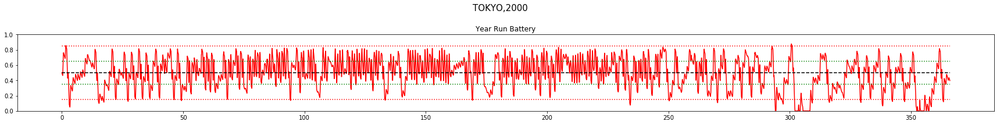

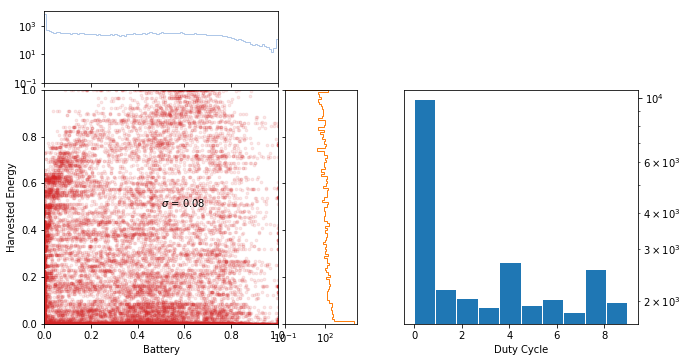

DAY: 119
REWARDS:  [ 2.000  2.000  2.000  2.000  2.000  2.000  2.000  2.000  2.000  2.000]
EPSILON : [ 0.695  0.695  0.695  0.695  0.695  0.695  0.695  0.695  0.695  0.695]
MEMORY:  28800

CHECKING... 


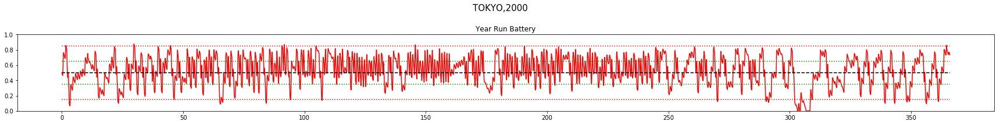

LOSS : 2.656


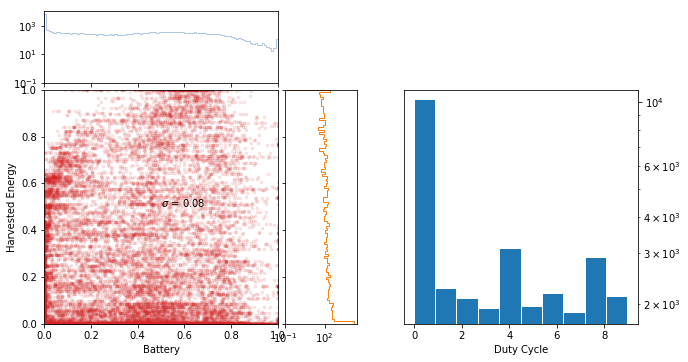

DAY: 126
REWARDS:  [ 2.000  2.000  2.000  2.000  2.000  2.000  2.000  2.000  2.000  2.000]
EPSILON : [ 0.730  0.730  0.730  0.730  0.730  0.730  0.730  0.730  0.730  0.730]
MEMORY:  30480

CHECKING... 


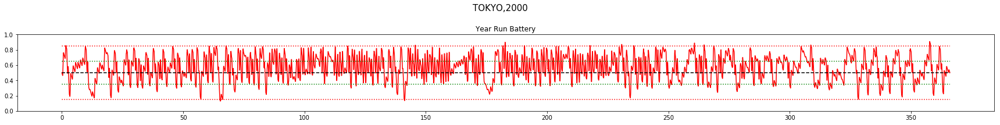

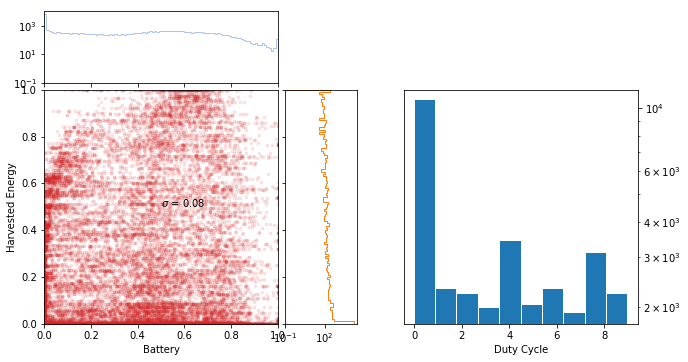

DAY: 133
REWARDS:  [ 2.000  2.000  2.000  2.000  2.000  2.000  2.000  2.000  2.000 -0.095]
EPSILON : [ 0.765  0.765  0.765  0.765  0.765  0.765  0.765  0.765  0.765  0.765]
MEMORY:  32160

CHECKING... 


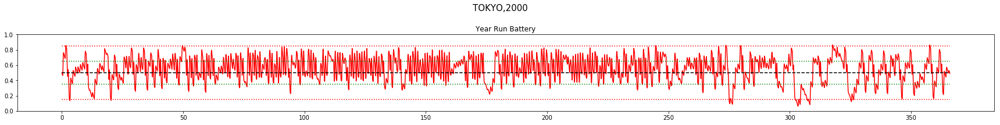

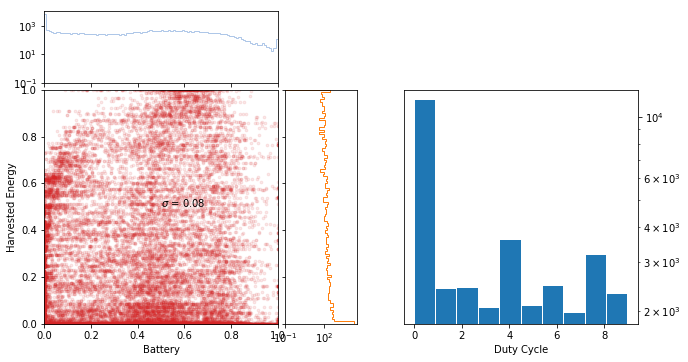

DAY: 140
REWARDS:  [ 2.000  2.000  2.000  2.000  2.000  2.000  2.000  2.000  2.000  2.000]
EPSILON : [ 0.800  0.800  0.800  0.800  0.800  0.800  0.800  0.800  0.800  0.800]
MEMORY:  33840

CHECKING... 


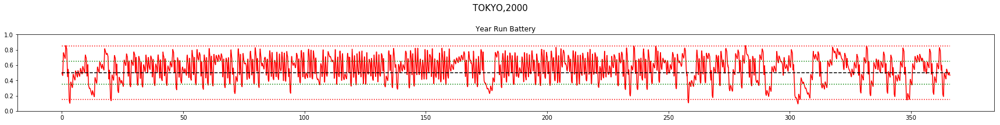

LOSS : 2.962


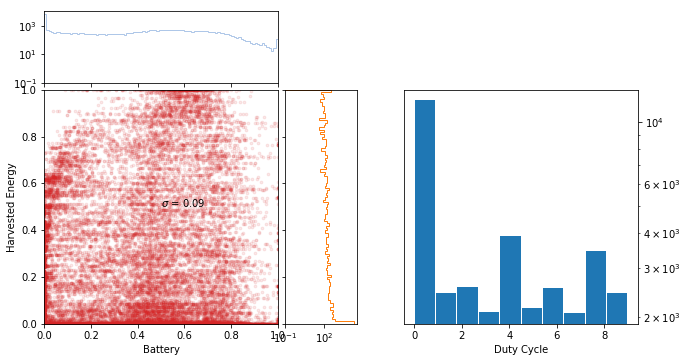

DAY: 147
REWARDS:  [ 2.000  2.000  2.000  2.000  2.000  2.000  2.000  2.000  2.000  2.000]
EPSILON : [ 0.835  0.835  0.835  0.835  0.835  0.835  0.835  0.835  0.835  0.835]
MEMORY:  35520

CHECKING... 


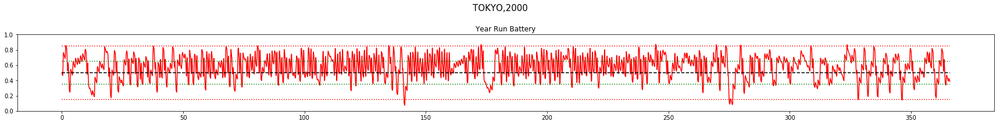

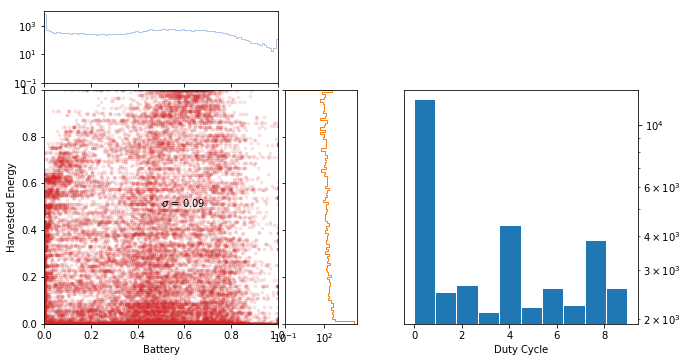

DAY: 154
REWARDS:  [ 2.000  2.000  2.000  2.000  2.000  2.000  2.000  2.000  2.000  2.000]
EPSILON : [ 0.870  0.870  0.870  0.870  0.870  0.870  0.870  0.870  0.870  0.870]
MEMORY:  37200

CHECKING... 


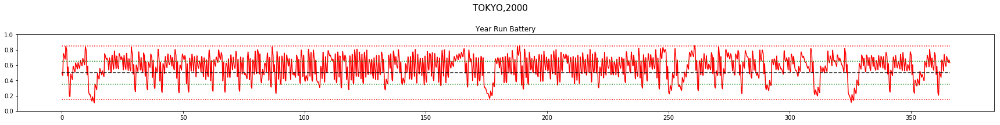

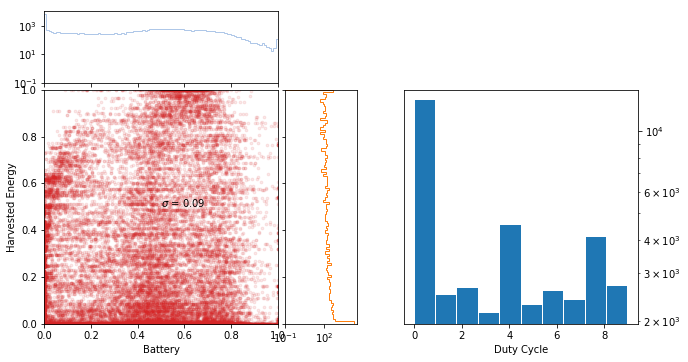

DAY: 161
REWARDS:  [-4.033  2.000  2.000  2.000  2.000  2.000  0.231  2.000  2.000  2.000]
EPSILON : [ 0.905  0.905  0.905  0.905  0.905  0.905  0.905  0.905  0.905  0.905]
MEMORY:  38880

CHECKING... 


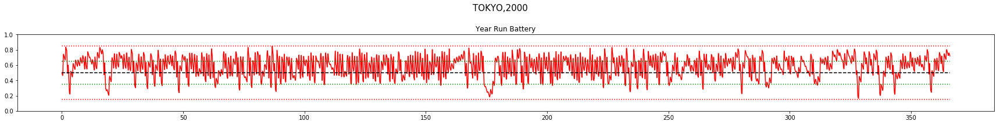

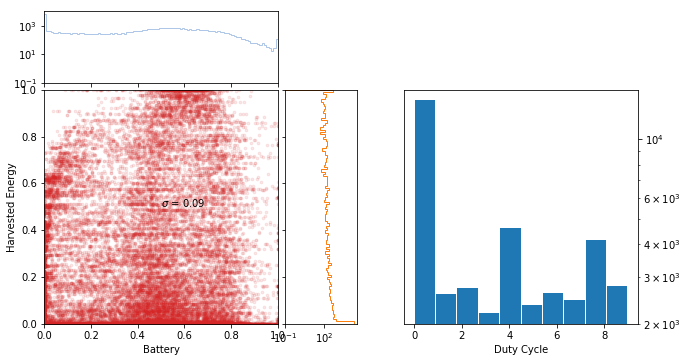

DAY: 168
REWARDS:  [ 2.000  2.000  2.000  2.000  2.000  2.000  2.000  2.000  2.000  2.000]
EPSILON : [ 0.940  0.940  0.940  0.940  0.940  0.940  0.940  0.940  0.940  0.940]
MEMORY:  40560

CHECKING... 


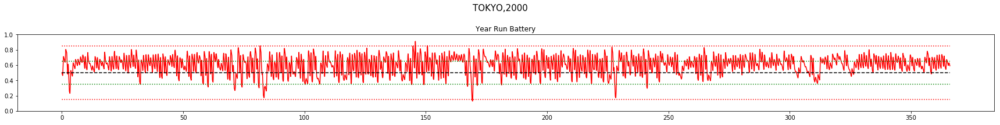

LOSS : 2.166


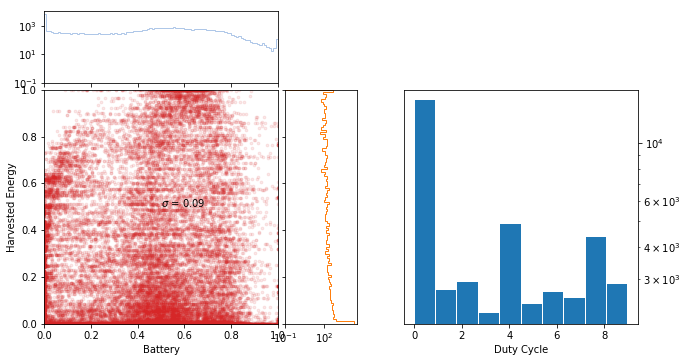

DAY: 175
REWARDS:  [ 2.000  2.000  2.000  2.000  2.000  2.000  2.000  2.000  2.000  2.000]
EPSILON : [ 0.975  0.975  0.975  0.975  0.975  0.975  0.975  0.975  0.975  0.975]
MEMORY:  42240

CHECKING... 


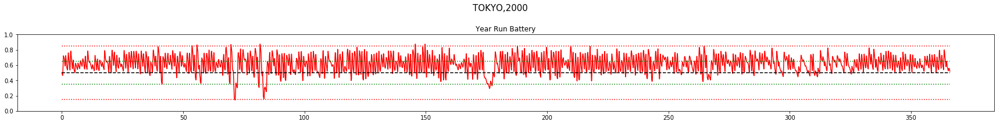

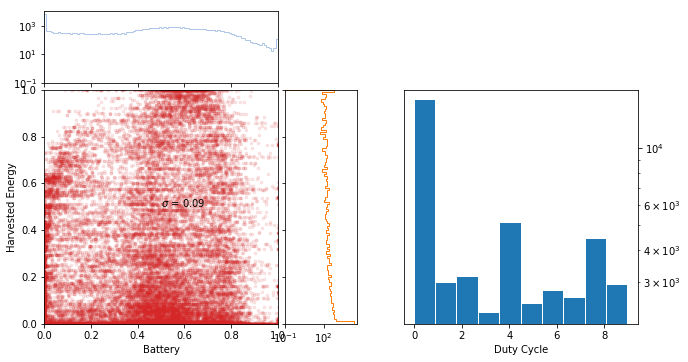

DAY: 182
REWARDS:  [ 2.000  2.000  2.000  2.000  2.000  2.000  2.000  2.000  2.000  2.000]
EPSILON : [ 0.990  0.990  0.990  0.990  0.990  0.990  0.990  0.990  0.990  0.990]
MEMORY:  43920

CHECKING... 


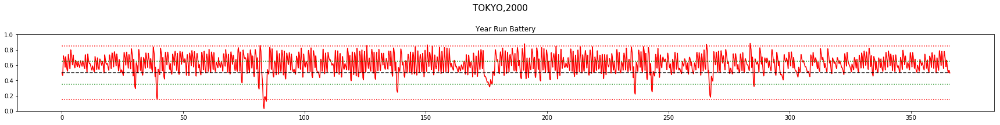

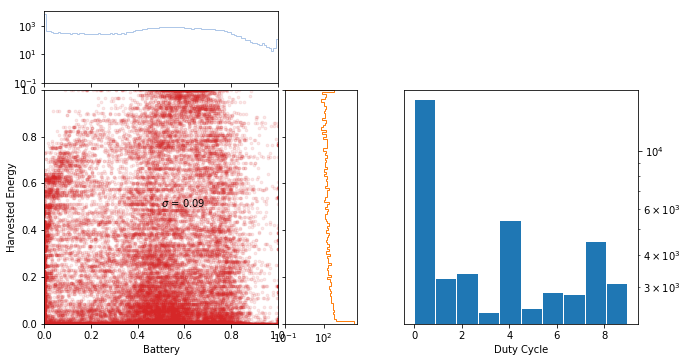

DAY: 189
REWARDS:  [ 2.000  2.000  2.000  2.000  2.000  2.000  2.000  2.000  2.000  2.000]
EPSILON : [ 0.990  0.990  0.990  0.990  0.990  0.990  0.990  0.990  0.990  0.990]
MEMORY:  45600

CHECKING... 


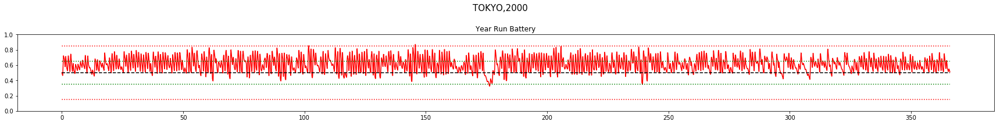

LOSS : 1.378


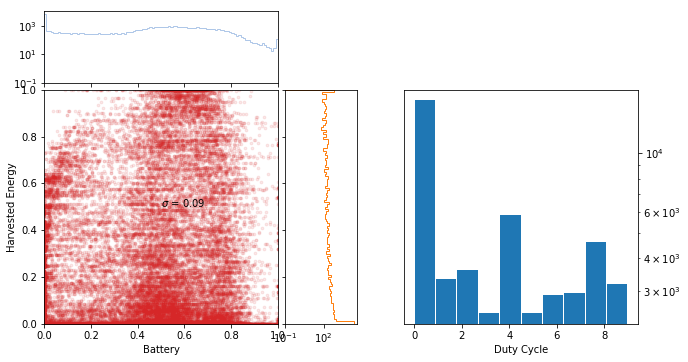

DAY: 196
REWARDS:  [ 2.000  2.000  2.000  2.000  2.000  2.000  2.000  2.000  2.000  2.000]
EPSILON : [ 0.990  0.990  0.990  0.990  0.990  0.990  0.990  0.990  0.990  0.990]
MEMORY:  47280

CHECKING... 


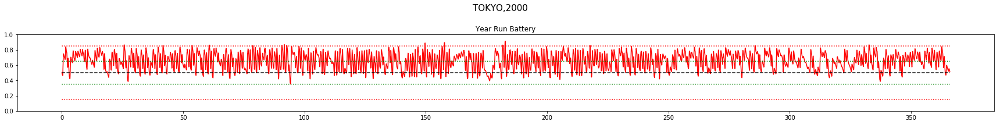

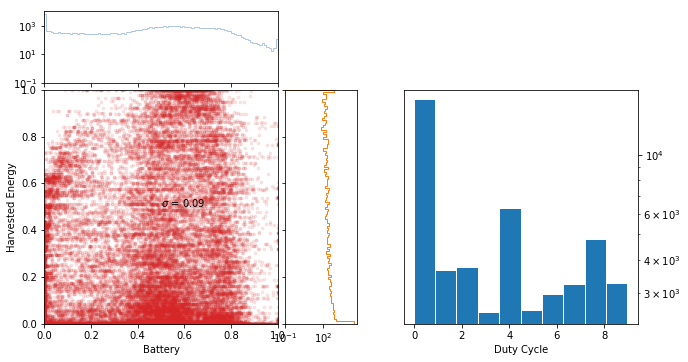

DAY: 203
REWARDS:  [ 2.000  2.000  2.000  2.000  2.000  2.000  2.000  2.000  2.000  2.000]
EPSILON : [ 0.990  0.990  0.990  0.990  0.990  0.990  0.990  0.990  0.990  0.990]
MEMORY:  48960

CHECKING... 


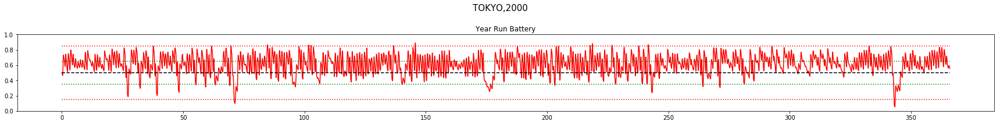

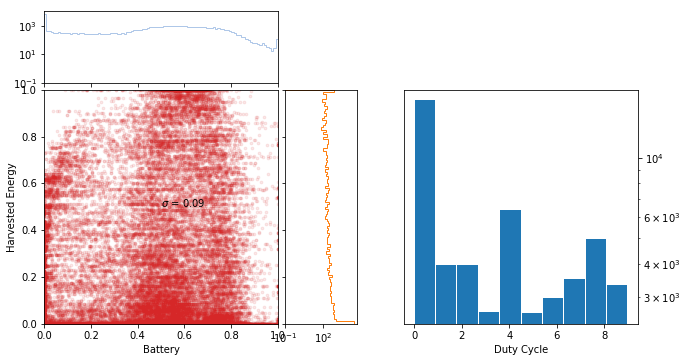

DAY: 210
REWARDS:  [ 2.000  2.000  2.000  2.000  2.000  2.000  2.000  2.000  2.000  2.000]
EPSILON : [ 0.990  0.990  0.990  0.990  0.990  0.990  0.990  0.990  0.990  0.990]
MEMORY:  50640

CHECKING... 


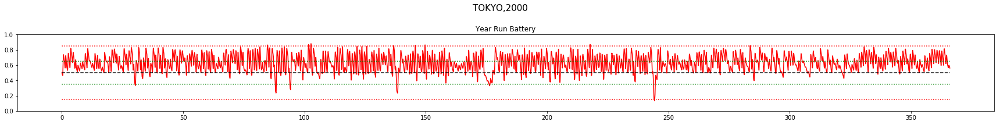

LOSS : 1.021


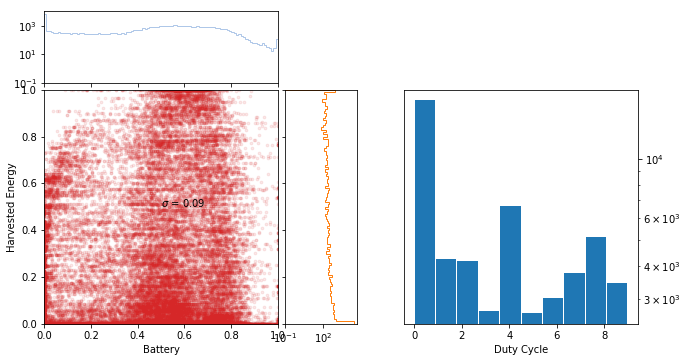

DAY: 217
REWARDS:  [ 2.000  2.000  2.000  2.000  2.000  2.000  2.000  2.000  2.000  2.000]
EPSILON : [ 0.990  0.990  0.990  0.990  0.990  0.990  0.990  0.990  0.990  0.990]
MEMORY:  52320

CHECKING... 


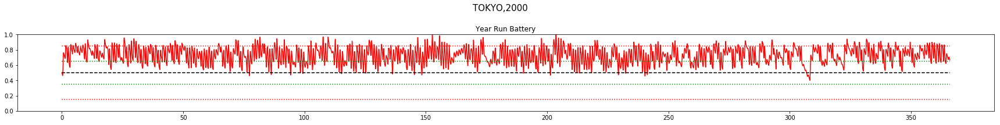

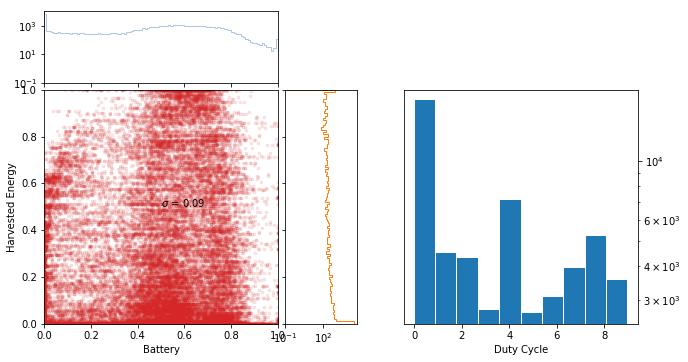

DAY: 224
REWARDS:  [ 2.000  2.000  2.000  2.000  2.000  2.000  2.000  2.000  2.000  2.000]
EPSILON : [ 0.990  0.990  0.990  0.990  0.990  0.990  0.990  0.990  0.990  0.990]
MEMORY:  54000

CHECKING... 


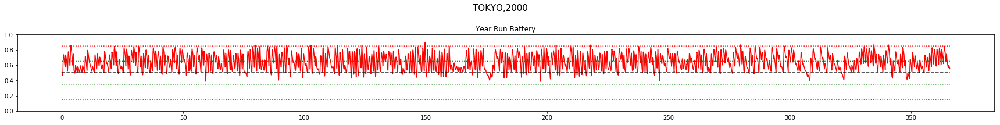

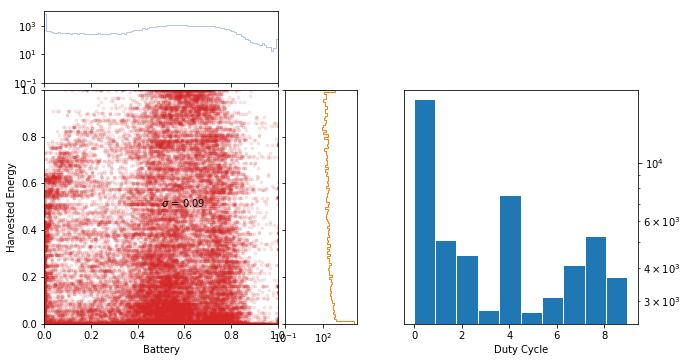

DAY: 231
REWARDS:  [ 2.000  2.000  2.000  2.000  2.000  2.000  2.000  2.000  2.000  2.000]
EPSILON : [ 0.990  0.990  0.990  0.990  0.990  0.990  0.990  0.990  0.990  0.990]
MEMORY:  55680

CHECKING... 


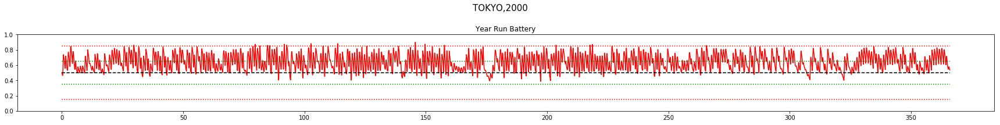

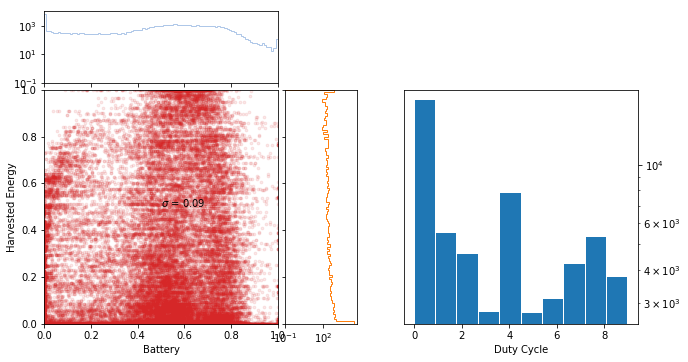

DAY: 238
REWARDS:  [ 2.000  2.000  2.000  2.000  2.000  2.000  2.000  2.000  2.000  2.000]
EPSILON : [ 0.990  0.990  0.990  0.990  0.990  0.990  0.990  0.990  0.990  0.990]
MEMORY:  57360

CHECKING... 


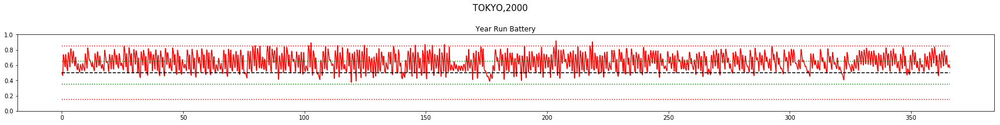

LOSS : 0.471


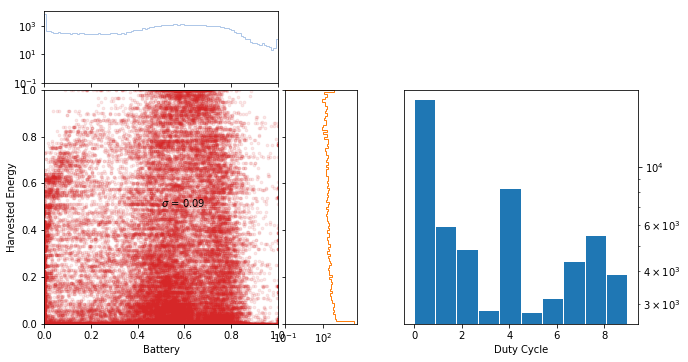

DAY: 245
REWARDS:  [ 2.000  2.000  2.000  2.000  2.000  2.000  2.000  2.000  2.000  2.000]
EPSILON : [ 0.990  0.990  0.990  0.990  0.990  0.990  0.990  0.990  0.990  0.990]
MEMORY:  59040

CHECKING... 


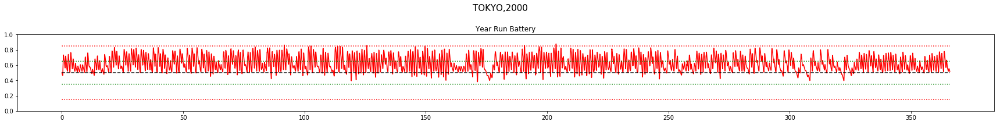

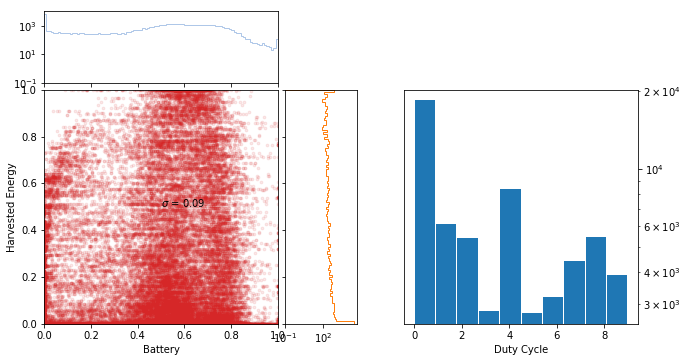

DAY: 252
REWARDS:  [ 2.000  2.000  2.000  2.000  2.000  2.000  2.000  2.000  2.000  2.000]
EPSILON : [ 0.990  0.990  0.990  0.990  0.990  0.990  0.990  0.990  0.990  0.990]
MEMORY:  60720

CHECKING... 


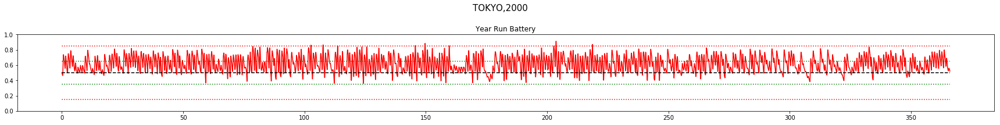

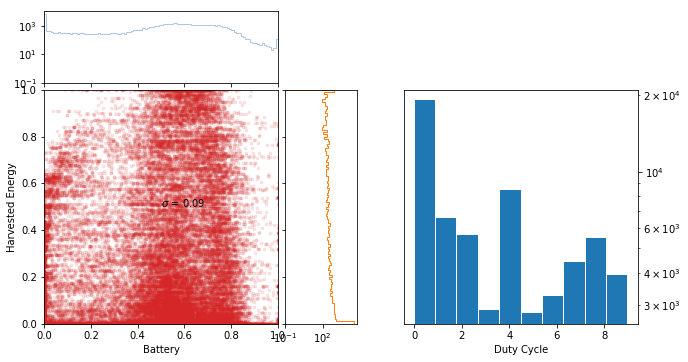

DAY: 259
REWARDS:  [ 2.000  2.000  2.000  2.000  2.000  2.000  2.000  2.000  2.000  2.000]
EPSILON : [ 0.990  0.990  0.990  0.990  0.990  0.990  0.990  0.990  0.990  0.990]
MEMORY:  62400

CHECKING... 


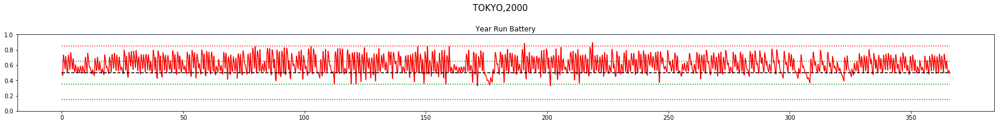

LOSS : 0.422


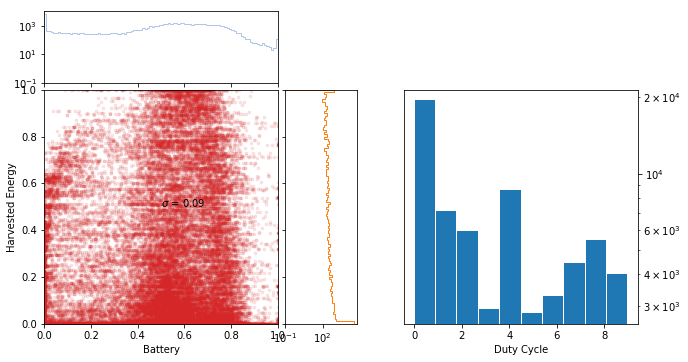

DAY: 266
REWARDS:  [ 2.000  2.000  2.000  2.000  2.000  2.000  2.000  2.000  2.000  2.000]
EPSILON : [ 0.990  0.990  0.990  0.990  0.990  0.990  0.990  0.990  0.990  0.990]
MEMORY:  64080

CHECKING... 


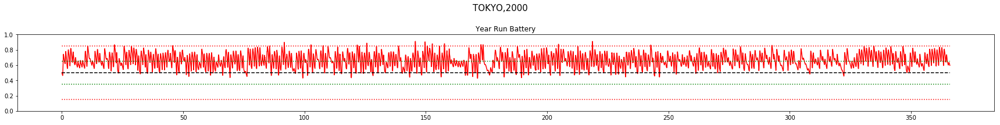

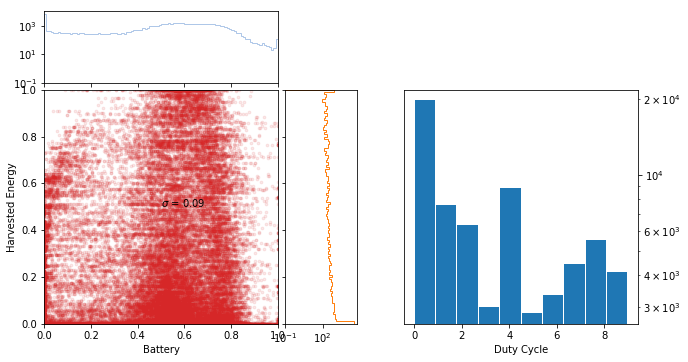

DAY: 273
REWARDS:  [ 2.000  2.000  2.000  2.000  2.000  2.000  2.000  2.000  2.000  2.000]
EPSILON : [ 0.990  0.990  0.990  0.990  0.990  0.990  0.990  0.990  0.990  0.990]
MEMORY:  65760

CHECKING... 


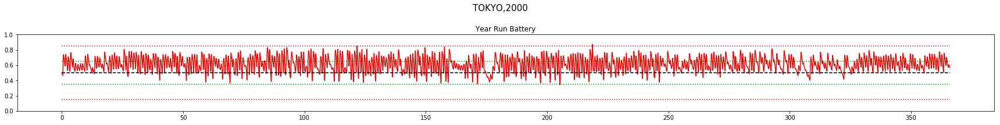

In [27]:
from figplot0 import figplot

node_batt_records = np.empty(NO_OF_NODES,)
node_reward_records = np.empty(NO_OF_NODES,)

state_space_coverage = np.empty(shape=[0, 2])
action_space_coverage = np.array([0])

for day in range(7*40):
    
    e_slope = 0.1/20
    e_start = 0.1
    sc_EPSILON = np.clip(e_start + e_slope*day,0.1,0.99)
    
    day_list = [day]*NO_OF_NODES
    sc_EPSILON_list = [sc_EPSILON]*NO_OF_NODES
    param_list = [MODEL_FILENAME]*NO_OF_NODES
    
    arglist = [arg for arg in zip(range(NO_OF_NODES),day_list, sc_EPSILON_list, param_list)]
    result = pool.starmap(T_ENO, arglist)
    
    node_experience  = np.array([item[0] for item in result])
    node_reward      = np.array([item[1] for item in result])
    node_empty_count = np.array([item[2] for item in result])
    node_full_count  = np.array([item[3] for item in result])
    ids = np.array([item[4] for item in result])
    yr = np.array([item[5] for item in result])
    eps = np.array([item[6] for item in result])


    
    all_exp = np.array([item for each_node_exp in node_experience 
                                for episode_exp in each_node_exp 
                                    for item in episode_exp]).reshape(-1,10)
    
    destdize_state = batch_destdize(all_exp[:,0:N_STATES])
    state_space_coverage = np.append(state_space_coverage, destdize_state[:,[0,2]], axis=0)
    action_space_coverage =  np.append(action_space_coverage, all_exp[:,N_STATES:N_STATES+1].flatten(),axis=0)


    node_batt_records = np.column_stack((node_batt_records,node_experience[:,:,0]))
    node_reward_records = np.column_stack((node_reward_records,node_experience[:,:,N_STATES+1]))

    dqn.memory = np.insert(dqn.memory, 0, all_exp , 0)
    dqn.memory = dqn.memory[:MEMORY_CAPACITY,:]
    dqn.memory_counter += all_exp.shape[0]

    
    if dqn.memory_counter > 24*7:#MEMORY_CAPACITY:
        for nn_iter in range(NN_ITERATIONS):
            dqn.learn()
        #validate by running for TIMESTEP_LIMIT iterations
        
        if day%7==0:
            figplot(state_space_coverage, action_space_coverage)
    #     print("\n*****************************************")
            print("DAY:", day)
            print("REWARDS: ", node_reward)
    #     print("EMPTY  : ", node_empty_count)
    #     print("FULL   : ", node_full_count)
    #     print("ID      :",ids)
    # #     print("YEAR    :",yr)
            print("EPSILON :",eps)
            print("MEMORY: ",dqn.memory_counter)


            print("\nCHECKING... ")
            # CHECKING NN MODEL
            #########################################################################################################################
            LOCATION = 'tokyo'
            YEAR = 2000#random.choice(np.arange(2000,2010))

            capm = CAPM(LOCATION,YEAR,shuffle=False, trainmode=False) #instantiate the CAPM class
            capm.eno = ENO(LOCATION,YEAR, shuffle=False, day_balance=False) #instantiate the environment inside the CAPM class
            capm.HMAX = capm.eno.SMAX #maximum power output of solar cell is set in CAPM object using the value in ENO object

            s, r, day_end, year_end = capm.reset()
            yr_test_record = np.empty(4)

            while True:
                a = dqn.choose_greedy_action(stdize(s))
                #state = [batt, enp, henergy, fcast]
                yr_test_record = np.vstack((yr_test_record, [s[0],s[2],r, a])) #record battery, henergy, reward and action

                # take action
                s_, r, day_end, year_end = capm.step(a)

                if year_end:
                    break

                s = s_

            yr_test_record = np.delete(yr_test_record, 0, 0) #remove the first row which is garbage
            yr_test_reward_rec = yr_test_record[:,2]
            yr_test_reward_rec = yr_test_reward_rec[::24]

            title = LOCATION.upper() + ',' + str(YEAR)
            NO_OF_DAYS = capm.eno.NO_OF_DAYS

            fig = plt.figure(figsize=(24,3))
            fig.suptitle(title, fontsize=15)

            #     ax1 = fig.add_subplot(211)
            #     ax1.plot(yr_test_reward_rec)
            #     ax1.set_title("\n\nYear Run Reward")
            #     ax1.set_ylim([-3,3])

            #Plot the reward and battery for the entire year run
            ax2 = fig.add_subplot(111)
            ax2.plot(yr_test_record[:,0],'r')
            ax2.plot(np.ones_like(yr_test_record[:,0])*capm.BOPT/capm.BMAX, 'k--')
            ax2.plot(np.ones_like(yr_test_record[:,0])*capm.BLIM_LO/capm.BMAX, 'r:')
            ax2.plot(np.ones_like(yr_test_record[:,0])*capm.BLIM_HI/capm.BMAX, 'r:')
            ax2.plot(np.ones_like(yr_test_record[:,0])*(capm.BOPT+capm.ENP_MARGIN /2) /capm.BMAX, 'g:')
            ax2.plot(np.ones_like(yr_test_record[:,0])*(capm.BOPT-capm.ENP_MARGIN/2)/capm.BMAX, 'g:')
            ax2.set_title("\n\nYear Run Battery")
            ax2.set_ylim([0,1])
            plt.sca(ax2)
            plt.xticks(np.arange(0, NO_OF_DAYS*24, 50*24),np.arange(0,NO_OF_DAYS,50))
            fig.tight_layout()
            plt.show()
            ##########################################################################################################################

        #     print("Day Violations           = {:6d}".format(capm.violation_counter))
        #     print("Battery Limit Violations = {:6d}".format(capm.batt_violations))
        #     print("Battery FULL Violations  = {:6d}".format(capm.batt_full_counter))
        #     print("Battery EMPTY Violations = {:6d}".format(capm.batt_empty_counter))
    
    # SAVE MODEL AND DISCRETIZE
    torch.save(dqn.eval_net.state_dict(), MODEL_FILENAME)
#   
    
        
#     # CHECKING TABULAR MODEL
#     ##########################################################################################################################
#     s, r, day_end, year_end = capm.reset()
#     yr_test_record = np.empty(4)

#     while True:
#         batt_val, enp_val, henergy_val, fcast_val = denormalize(s).flatten()
#         discrete_s = discretize(batt_val, enp_val, henergy_val, fcast_val)

#         a = node_q_table[tuple(discrete_s)].argmax()

#         #state = [batt, enp, henergy, fcast]
#         yr_test_record = np.vstack((yr_test_record, [s[0],s[2],r, a])) #record battery, henergy, reward and action

#         # take action
#         s_, r, day_end, year_end = capm.step(a)

#         if year_end:
#             break

#         s = s_

#     yr_test_record = np.delete(yr_test_record, 0, 0) #remove the first row which is garbage
#     yr_test_reward_rec = yr_test_record[:,2]
#     yr_test_reward_rec = yr_test_reward_rec[::24]

#     print("\n\n************************************")
#     print("Anuual Average Reward    = {:6.2f}".format(np.mean(yr_test_reward_rec)))
#     print("Day Violations           = {:6d}".format(capm.violation_counter))
#     print("Battery Limit Violations = {:6d}".format(capm.batt_violations))
#     print("Battery FULL Violations  = {:6d}".format(capm.batt_full_counter))
#     print("Battery EMPTY Violations = {:6d}".format(capm.batt_empty_counter))

#     title = LOCATION.upper() + ',' + str(YEAR)
#     NO_OF_DAYS = capm.eno.NO_OF_DAYS

#     fig = plt.figure(figsize=(24,3))
#     fig.suptitle(title, fontsize=15)

#     #     ax1 = fig.add_subplot(211)
#     #     ax1.plot(yr_test_reward_rec)
#     #     ax1.set_title("\n\nYear Run Reward")
#     #     ax1.set_ylim([-3,3])

#     #Plot the reward and battery for the entire year run
#     ax2 = fig.add_subplot(111)
#     ax2.plot(yr_test_record[:,0],'b')
#     ax2.plot(np.ones_like(yr_test_record[:,0])*capm.BOPT/capm.BMAX, 'k--')
#     ax2.plot(np.ones_like(yr_test_record[:,0])*capm.BLIM_LO/capm.BMAX, 'r:')
#     ax2.plot(np.ones_like(yr_test_record[:,0])*capm.BLIM_HI/capm.BMAX, 'r:')
#     ax2.plot(np.ones_like(yr_test_record[:,0])*(capm.BOPT+capm.ENP_MARGIN /2) /capm.BMAX, 'g:')
#     ax2.plot(np.ones_like(yr_test_record[:,0])*(capm.BOPT-capm.ENP_MARGIN/2)/capm.BMAX, 'g:')
#     ax2.set_title("\n\nYear Run Battery")
#     ax2.set_ylim([0,1])
#     plt.sca(ax2)
#     plt.xticks(np.arange(0, NO_OF_DAYS*24, 50*24),np.arange(0,NO_OF_DAYS,50))
#     fig.tight_layout()
#     plt.show()
#     ##########################################################################################################################

    
    
pool.close()
pool.join()
    
    

In [28]:
pool.close()
pool.join()

In [29]:
node_batt_records= np.delete(node_batt_records,0,1)
node_reward_records= np.delete(node_reward_records,0,1)

In [30]:
MU_BATT = 0.5
SD_BATT = 0.5
node_batt_records = (node_batt_records * SD_BATT)+ MU_BATT

In [31]:
# for i in range(node_batt_records.shape[0]):
#     node_batt_records[i]-=i*2

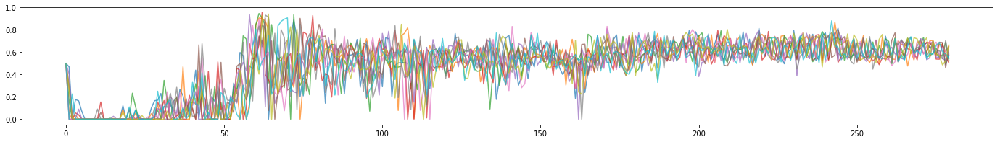

In [32]:
fig = plt.figure(figsize=(24,3))
plt.plot(node_batt_records.T[0::24],alpha=0.7);

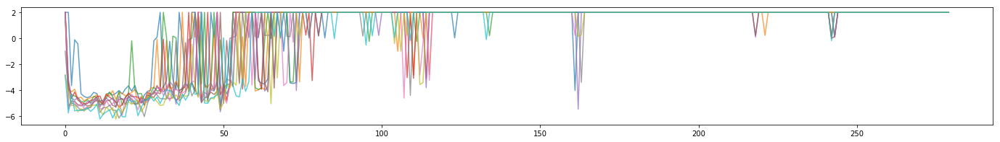

In [33]:
fig = plt.figure(figsize=(24,3))
plt.plot(node_reward_records.T[0::24],alpha=0.7);

In [34]:
np.save("DRL-v1_node_batt_rec", node_batt_records)

In [35]:
np.save("DRL-v1_node_reward_rec", node_reward_records)

In [36]:
# TESTING THE DISCRETE Q-TABLE
# YEAR = 2007

# capm = CAPM(LOCATION,YEAR,shuffle=False, trainmode=False) #instantiate the CAPM class
# capm.eno = ENO(LOCATION,YEAR, shuffle=False, day_balance=False) #instantiate the environment inside the CAPM class
# capm.HMAX = capm.eno.SMAX #maximum power output of solar cell is set in CAPM object using the value in ENO object

# s, r, day_end, year_end = capm.reset()
# yr_test_record = np.empty(4)

# while True:
#     batt_val, enp_val, henergy_val, fcast_val = denormalize(s).flatten()
#     discrete_s = discretize(batt_val, enp_val, henergy_val, fcast_val)
    
#     a = Q_TABLE[tuple(discrete_s)].argmax()

#     #state = [batt, enp, henergy, fcast]
#     yr_test_record = np.vstack((yr_test_record, [s[0],s[2],r, a])) #record battery, henergy, reward and action

#     # take action
#     s_, r, day_end, year_end = capm.step(a)

#     if year_end:
#         break

#     s = s_

# yr_test_record = np.delete(yr_test_record, 0, 0) #remove the first row which is garbage
# yr_test_reward_rec = yr_test_record[:,2]
# yr_test_reward_rec = yr_test_reward_rec[::24]

# print("\n\n************************************")
# print("Anuual Average Reward    = {:6.2f}".format(np.mean(yr_test_reward_rec)))
# print("Day Violations           = {:6d}".format(capm.violation_counter))
# print("Battery Limit Violations = {:6d}".format(capm.batt_violations))
# print("Battery FULL Violations  = {:6d}".format(capm.batt_full_counter))
# print("Battery EMPTY Violations = {:6d}".format(capm.batt_empty_counter))

# title = LOCATION.upper() + ',' + str(YEAR)
# NO_OF_DAYS = capm.eno.NO_OF_DAYS

# fig = plt.figure(figsize=(24,6))
# fig.suptitle(title, fontsize=15)

# #     ax1 = fig.add_subplot(211)
# #     ax1.plot(yr_test_reward_rec)
# #     ax1.set_title("\n\nYear Run Reward")
# #     ax1.set_ylim([-3,3])

# #Plot the reward and battery for the entire year run
# ax2 = fig.add_subplot(111)
# ax2.plot(yr_test_record[:,0],'r')
# ax2.plot(np.ones_like(yr_test_record[:,0])*capm.BOPT/capm.BMAX, 'k--')
# ax2.plot(np.ones_like(yr_test_record[:,0])*capm.BLIM_LO/capm.BMAX, 'r:')
# ax2.plot(np.ones_like(yr_test_record[:,0])*capm.BLIM_HI/capm.BMAX, 'r:')
# ax2.plot(np.ones_like(yr_test_record[:,0])*(capm.BOPT+capm.ENP_MARGIN /2) /capm.BMAX, 'g:')
# ax2.plot(np.ones_like(yr_test_record[:,0])*(capm.BOPT-capm.ENP_MARGIN/2)/capm.BMAX, 'g:')
# ax2.set_title("\n\nYear Run Battery")
# ax2.set_ylim([0,1])
# plt.sca(ax2)
# plt.xticks(np.arange(0, NO_OF_DAYS*24, 50*24),np.arange(0,NO_OF_DAYS,50))
# fig.tight_layout()
# plt.show()

# DAY_START = 260
# DAY_END   = 280

# #Plot the reward and battery for the entire year run on a day by day basis
# title = LOCATION.upper() + ',' + str(YEAR)
# TIME_AXIS = np.arange(0,capm.eno.TIME_STEPS)
# for DAY in range(DAY_START,DAY_END):
#     START = DAY*24
#     END = START+24

#     daytitle = title + ' - DAY ' + str(DAY)
#     fig = plt.figure(figsize=(16,4))
#     st = fig.suptitle(daytitle)

#     ax2 = fig.add_subplot(121)
#     ax2.plot(yr_test_record[START:END,1],'g')
#     ax2.set_title("HARVESTED ENERGY")
#     ax2.set_xlabel("Hour")
#     ax2.set_ylim([0,1.05])
    
#     ax2.text(0.1, 0.6, "TENP = %.2f\n" %(capm.BOPT/capm.BMAX-yr_test_record[END,0]),fontsize=11, ha='left')
#     ax2.text(0.1, 0.5, "BMEAN = %.2f\n" %(np.mean(yr_test_record[START:END,0])),fontsize=11, ha='left')
#     ax2.text(0.1, 0.4, "BINIT = %.2f\n" %(yr_test_record[START,0]),fontsize=11, ha='left')
#     if END < (capm.eno.NO_OF_DAYS*capm.eno.TIME_STEPS):
#         ax2.text(0.1, 0.1, "REWARD = %.2f\n" %(yr_test_record[END,2]),fontsize=13, ha='left')
        
#     #plot battery for year run
#     ax1 = fig.add_subplot(122)
#     ax1.plot(TIME_AXIS,              yr_test_record[START:END,0],'r')
#     ax1.plot(TIME_AXIS, np.ones_like(yr_test_record[START:END,0])*capm.BOPT/capm.BMAX, 'r--')
#     ax1.plot(TIME_AXIS, np.ones_like(yr_test_record[START:END,0])*capm.BLIM_LO/capm.BMAX, 'r-.',alpha=0.5)
#     ax1.plot(TIME_AXIS, np.ones_like(yr_test_record[START:END,0])*capm.BLIM_HI/capm.BMAX, 'r-.',alpha=0.5)
#     ax1.plot(TIME_AXIS, np.ones_like(yr_test_record[START:END,0])*(capm.BOPT+capm.ENP_MARGIN /2) /capm.BMAX, 'g:',alpha=0.5)
#     ax1.plot(TIME_AXIS, np.ones_like(yr_test_record[START:END,0])*(capm.BOPT-capm.ENP_MARGIN/2)/capm.BMAX, 'g:',alpha=0.5)
    
#     ax1.set_title("YEAR RUN TEST")
#     ax1.set_xlabel("Hour")
#     ax1.set_ylabel('Battery', color='r',fontsize=12)
#     ax1.set_ylim([-0.05,1.05])

#     #plot actions for year run
#     ax1a = ax1.twinx()
#     ax1a.plot(yr_test_record[START:END,3]+1)
#     ax1a.set_ylim([0,N_ACTIONS])
#     ax1a.set_ylabel('Duty Cycle', color='b',fontsize=12)
#     ax1a.set_ylim([0,10.25])


#     fig.tight_layout()
#     st.set_y(0.95)
#     fig.subplots_adjust(top=0.75)
#     plt.show()

In [37]:
S_FILENAME = MODEL_FILENAME
print("Loading MODEL from FILE: ", S_FILENAME)
dqn = DQN()
dqn.eval_net.load_state_dict(torch.load(S_FILENAME))
dqn.eval_net.eval()
print("DEVICE: ", dqn.device)

Loading MODEL from FILE:  ./models/ENO_ECO_STI6WR1Z__21_17_03__161.pt
DEVICE:  cpu


***MEASURING PERFORMANCE OF THE MODEL***


************************************
Day Violations           =    119
Battery Limit Violations =   1729
Battery FULL Violations  =      0
Battery EMPTY Violations =   1729


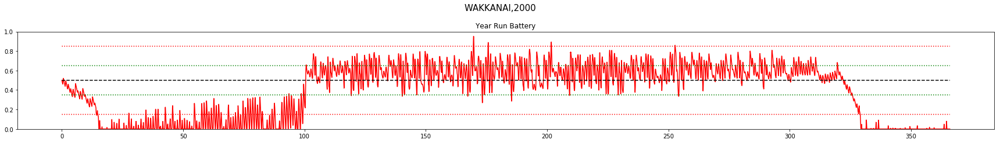



************************************
Day Violations           =    118
Battery Limit Violations =   1810
Battery FULL Violations  =      0
Battery EMPTY Violations =   1810


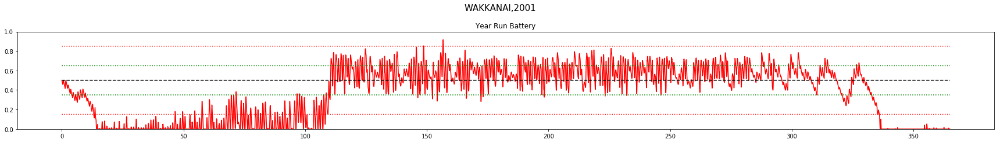



************************************
Day Violations           =     38
Battery Limit Violations =    840
Battery FULL Violations  =      0
Battery EMPTY Violations =    840


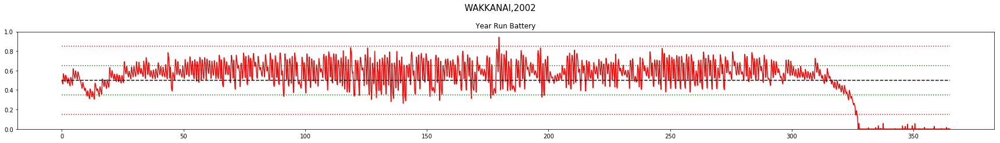



************************************
Day Violations           =     24
Battery Limit Violations =    522
Battery FULL Violations  =      0
Battery EMPTY Violations =    522


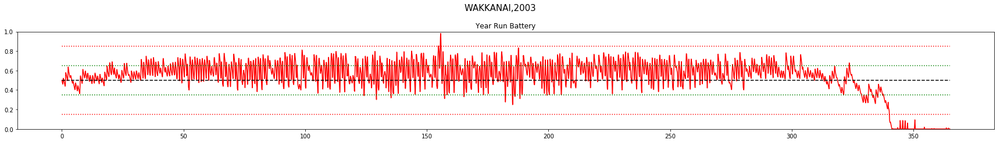



************************************
Day Violations           =    111
Battery Limit Violations =   1752
Battery FULL Violations  =      0
Battery EMPTY Violations =   1752


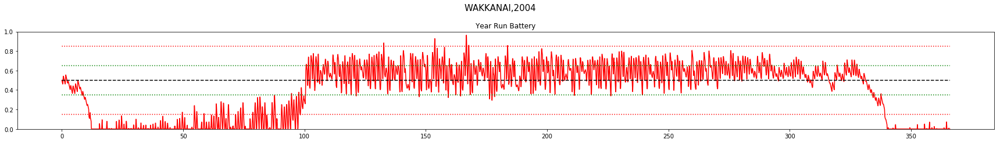



************************************
Day Violations           =    109
Battery Limit Violations =   1606
Battery FULL Violations  =      0
Battery EMPTY Violations =   1606


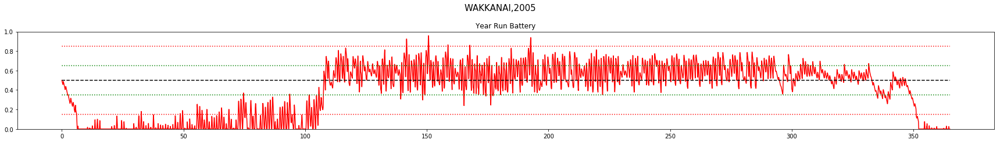



************************************
Day Violations           =     27
Battery Limit Violations =    590
Battery FULL Violations  =      0
Battery EMPTY Violations =    590


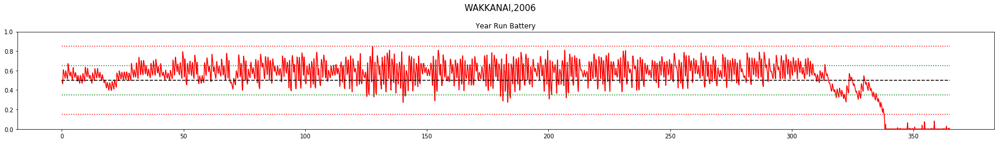



************************************
Day Violations           =     31
Battery Limit Violations =    686
Battery FULL Violations  =      0
Battery EMPTY Violations =    686


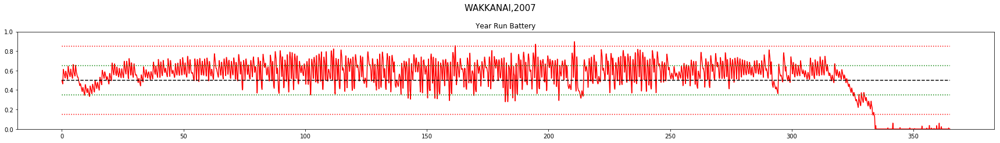



************************************
Day Violations           =    111
Battery Limit Violations =   1718
Battery FULL Violations  =      0
Battery EMPTY Violations =   1718


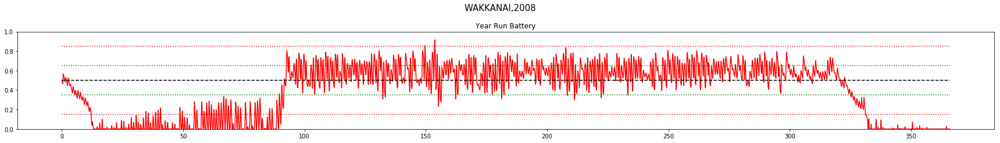



************************************
Day Violations           =    109
Battery Limit Violations =   1838
Battery FULL Violations  =      0
Battery EMPTY Violations =   1838


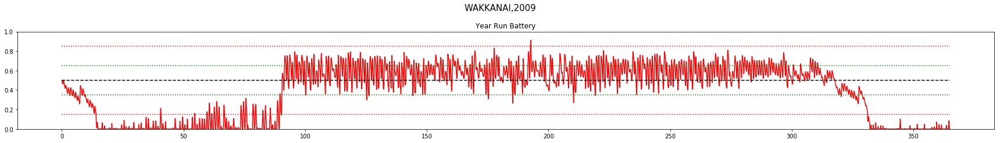



************************************
Day Violations           =     26
Battery Limit Violations =    557
Battery FULL Violations  =      0
Battery EMPTY Violations =    557


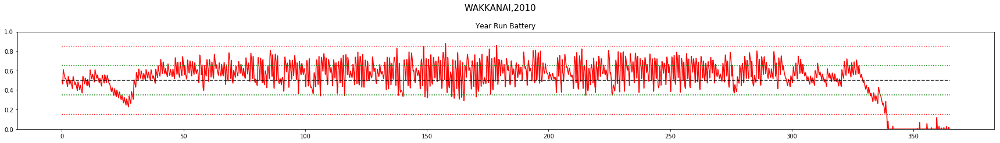



************************************
Day Violations           =     42
Battery Limit Violations =    908
Battery FULL Violations  =      0
Battery EMPTY Violations =    908


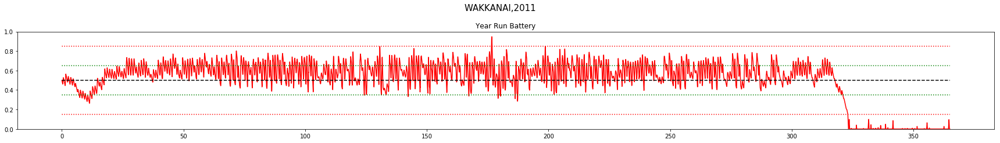



************************************
Day Violations           =     36
Battery Limit Violations =    812
Battery FULL Violations  =      0
Battery EMPTY Violations =    812


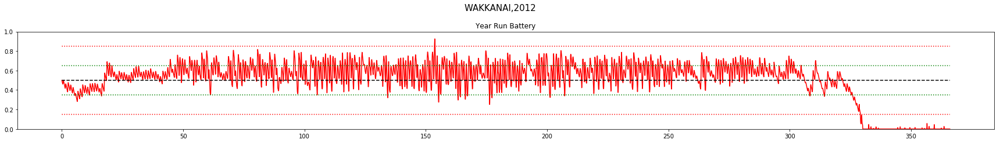



************************************
Day Violations           =    108
Battery Limit Violations =   1760
Battery FULL Violations  =      0
Battery EMPTY Violations =   1760


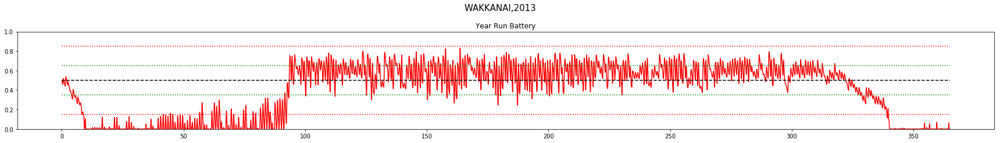



************************************
Day Violations           =     20
Battery Limit Violations =    416
Battery FULL Violations  =      0
Battery EMPTY Violations =    416


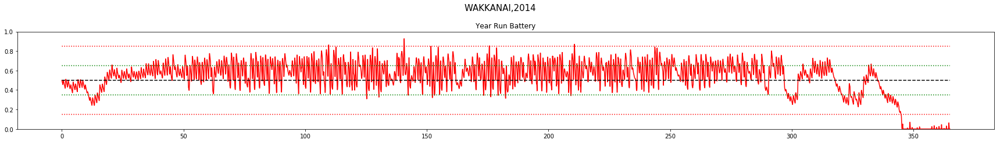



************************************
Day Violations           =    114
Battery Limit Violations =   1731
Battery FULL Violations  =      0
Battery EMPTY Violations =   1731


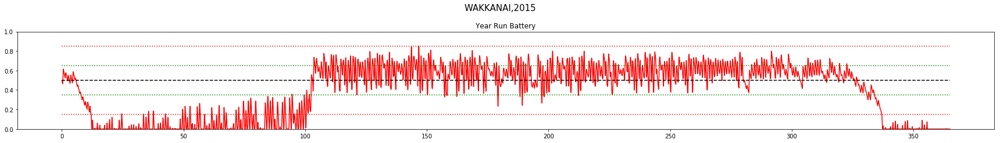



************************************
Day Violations           =    121
Battery Limit Violations =   2073
Battery FULL Violations  =      0
Battery EMPTY Violations =   2073


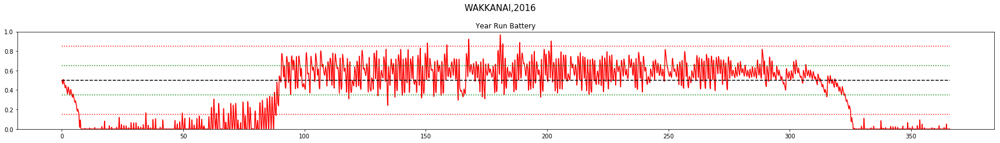



************************************
Day Violations           =     39
Battery Limit Violations =    850
Battery FULL Violations  =      0
Battery EMPTY Violations =    850


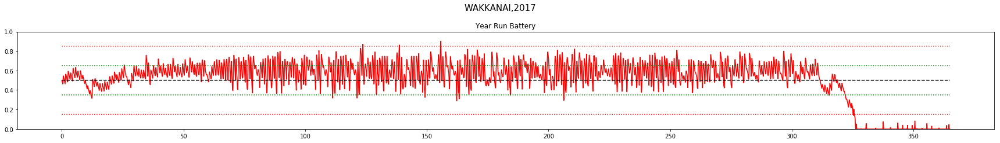



************************************
Day Violations           =     97
Battery Limit Violations =   1731
Battery FULL Violations  =      0
Battery EMPTY Violations =   1731


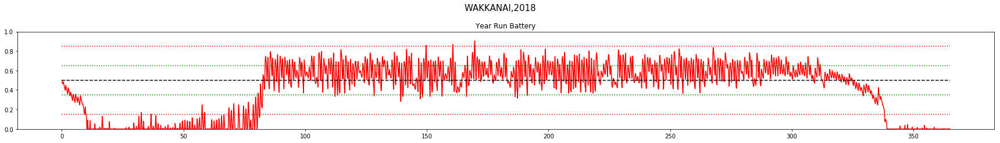



WAKKANAI
YEAR	AVG_RWD		VIOLATIONS	EMPTY	FULL
			DAY	BATT
2000	 -0.19		119	 1729	1729	0
2001	 -0.22		118	 1810	1810	0
2002	 1.25		38	 840	840	0
2003	 1.52		24	 522	522	0
2004	 -0.07		111	 1752	1752	0
2005	 -0.04		109	 1606	1606	0
2006	 1.47		27	 590	590	0
2007	 1.39		31	 686	686	0
2008	 -0.07		111	 1718	1718	0
2009	 -0.07		109	 1838	1838	0
2010	 1.49		26	 557	557	0
2011	 1.18		42	 908	908	0
2012	 1.28		36	 812	812	0
2013	 -0.03		108	 1760	1760	0
2014	 1.61		20	 416	416	0
2015	 -0.14		114	 1731	1731	0
2016	 -0.3		121	 2073	2073	0
2017	 1.23		39	 850	850	0
2018	 0.14		97	 1731	1731	0

TOTAL Day  Violations:   1400.0
TOTAL Batt  Violations:  23929.0
TOTAL EMPTY Violations:  23929.0
TOTAL FULL  Violations:  0.0
************************************


************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


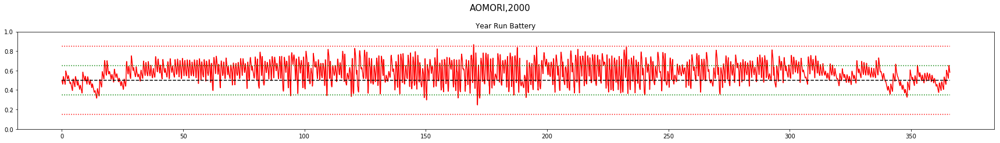



************************************
Day Violations           =     16
Battery Limit Violations =    313
Battery FULL Violations  =      0
Battery EMPTY Violations =    313


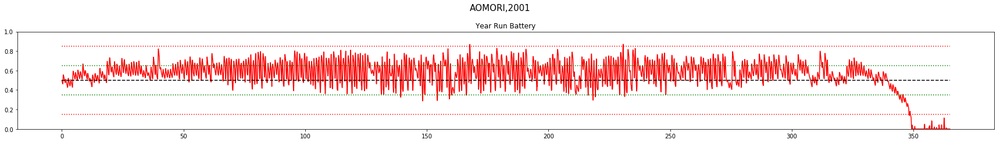



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


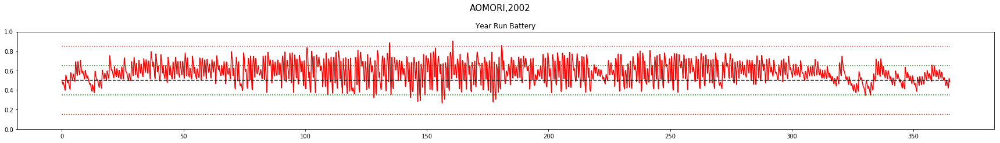



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


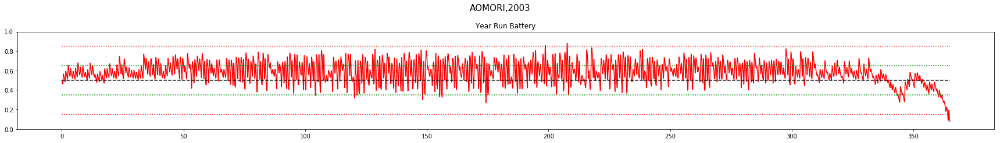



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


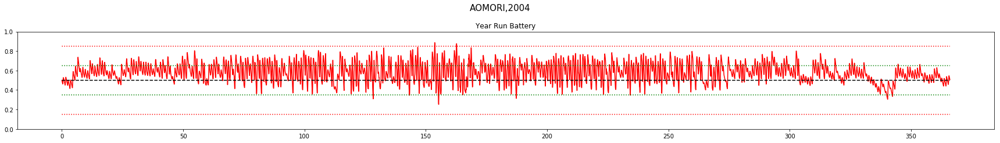



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


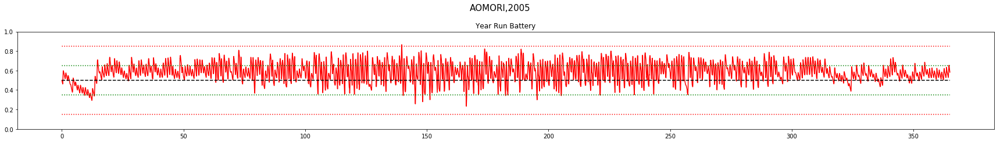



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


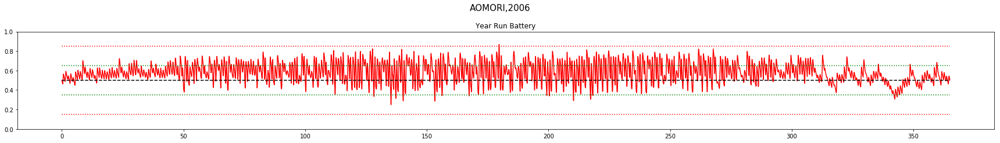



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


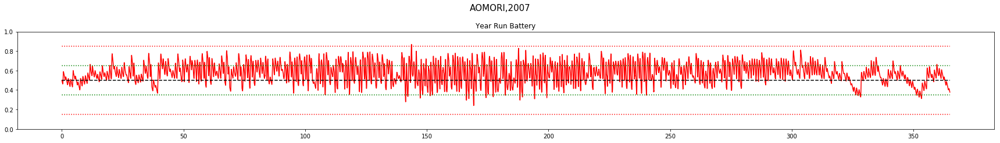



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


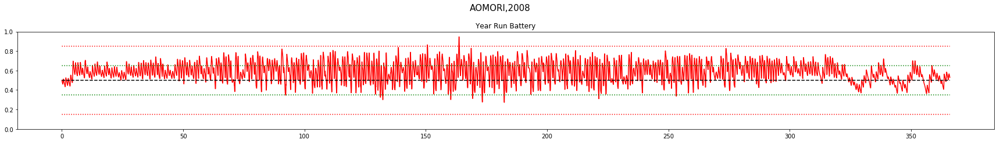



************************************
Day Violations           =      6
Battery Limit Violations =    123
Battery FULL Violations  =      0
Battery EMPTY Violations =    123


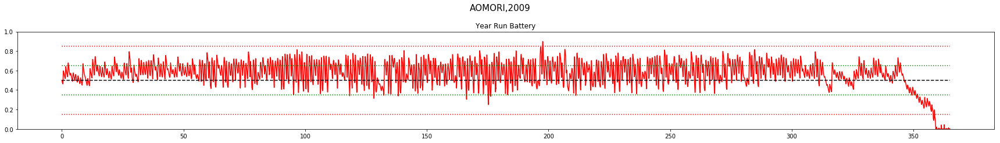



************************************
Day Violations           =     21
Battery Limit Violations =    397
Battery FULL Violations  =      0
Battery EMPTY Violations =    397


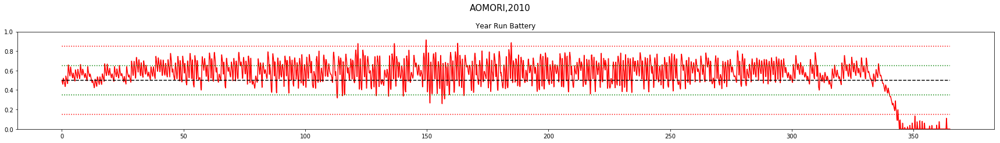



************************************
Day Violations           =     24
Battery Limit Violations =    475
Battery FULL Violations  =      0
Battery EMPTY Violations =    475


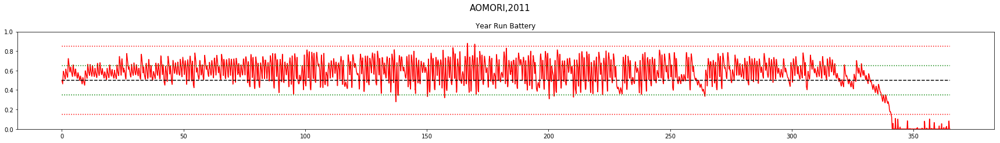



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


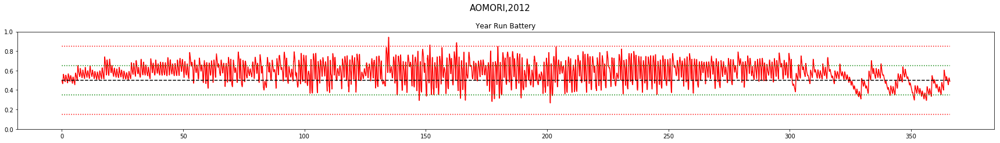



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


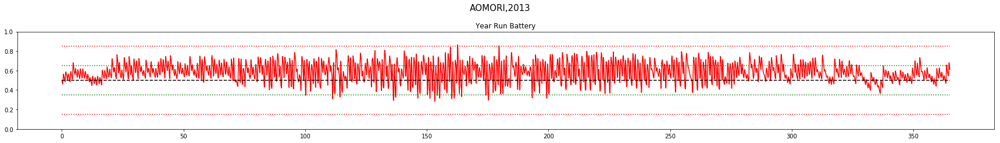



************************************
Day Violations           =     19
Battery Limit Violations =    366
Battery FULL Violations  =      0
Battery EMPTY Violations =    366


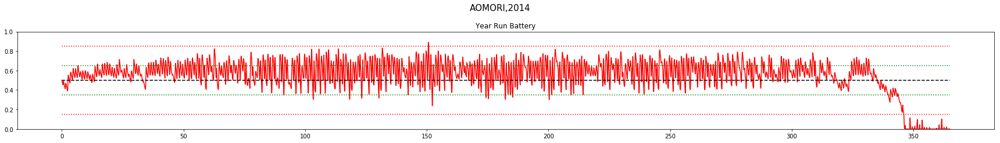



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


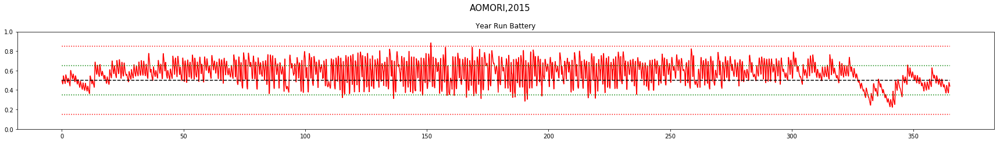



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


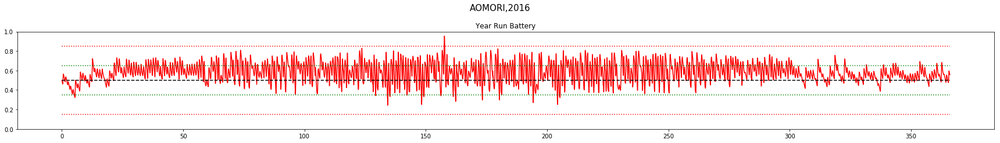



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


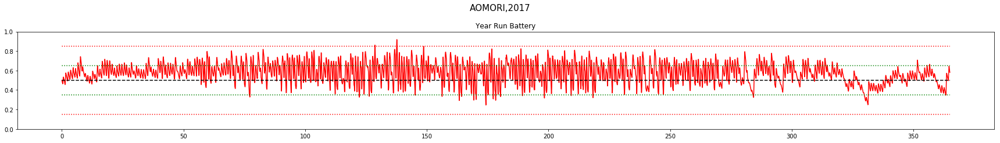



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


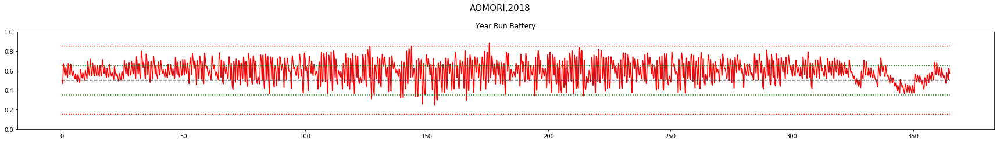



AOMORI
YEAR	AVG_RWD		VIOLATIONS	EMPTY	FULL
			DAY	BATT
2000	 1.99		0	 0	0	0
2001	 1.69		16	 313	313	0
2002	 1.99		0	 0	0	0
2003	 1.99		0	 0	0	0
2004	 1.99		0	 0	0	0
2005	 1.99		0	 0	0	0
2006	 1.99		0	 0	0	0
2007	 1.99		0	 0	0	0
2008	 1.99		0	 0	0	0
2009	 1.89		6	 123	123	0
2010	 1.6		21	 397	397	0
2011	 1.54		24	 475	475	0
2012	 1.99		0	 0	0	0
2013	 1.99		0	 0	0	0
2014	 1.64		19	 366	366	0
2015	 1.99		0	 0	0	0
2016	 1.99		0	 0	0	0
2017	 1.99		0	 0	0	0
2018	 1.99		0	 0	0	0

TOTAL Day  Violations:   86.0
TOTAL Batt  Violations:  1674.0
TOTAL EMPTY Violations:  1674.0
TOTAL FULL  Violations:  0.0
************************************


************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


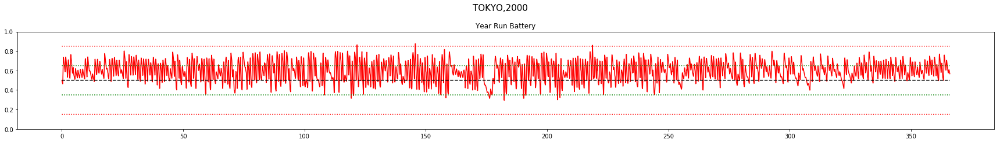



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


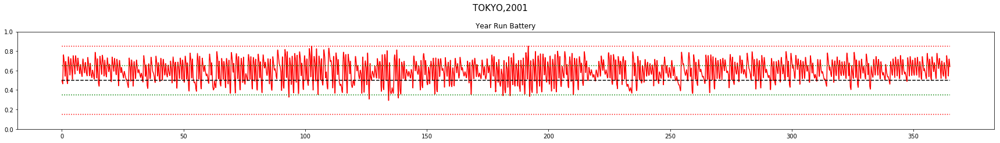



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


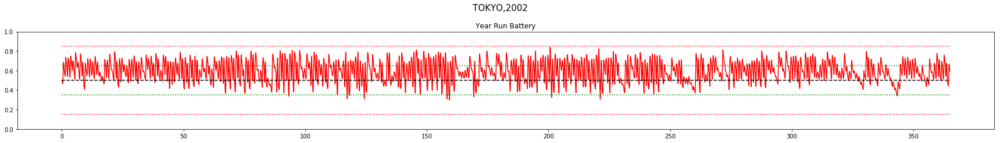



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


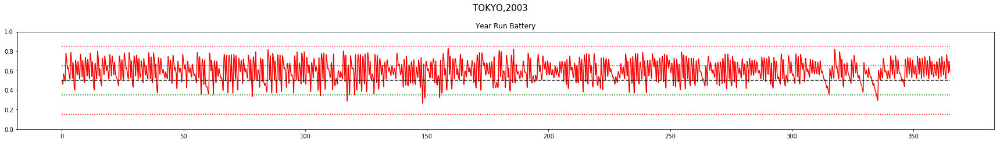



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


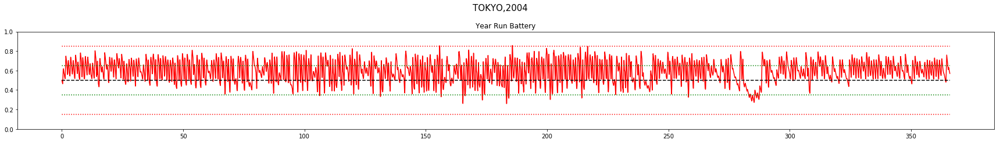



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


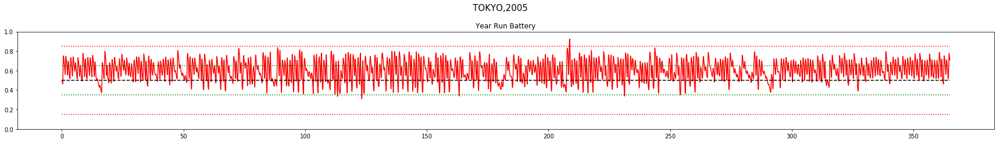



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


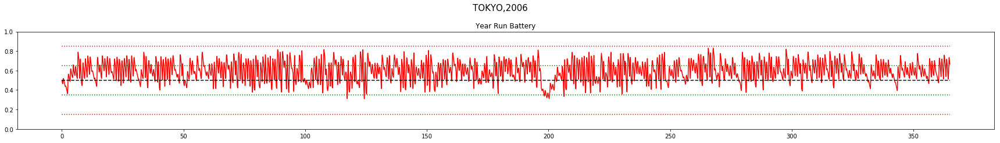



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


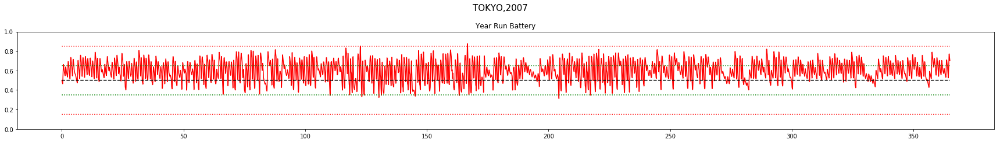



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


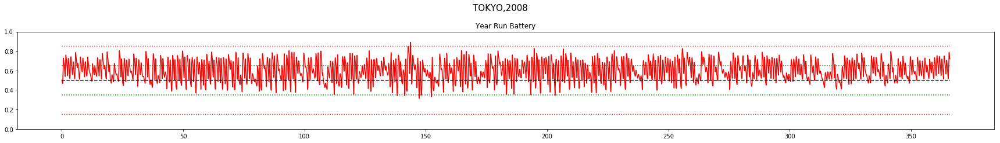



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


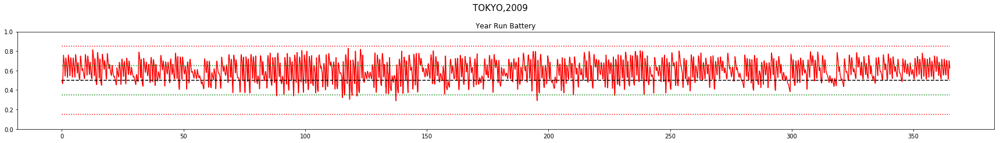



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


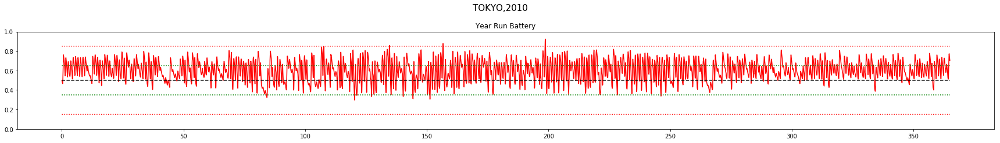



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


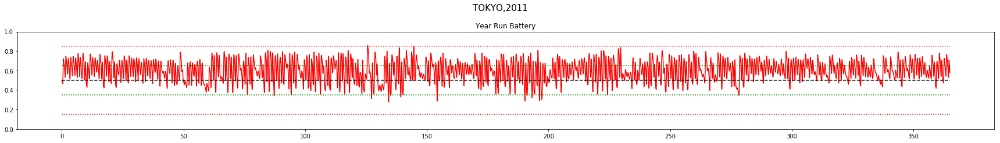



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


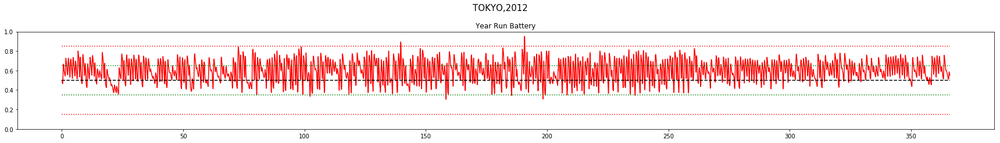



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


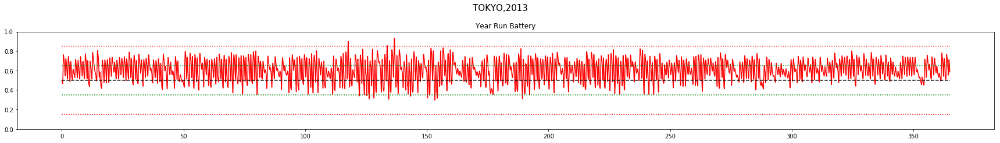



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


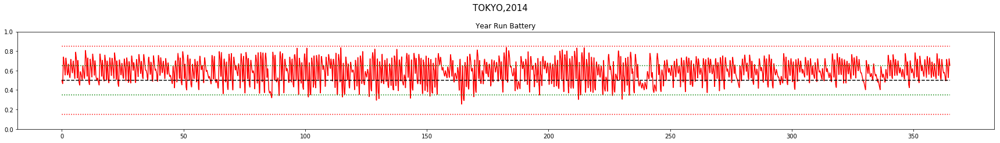



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


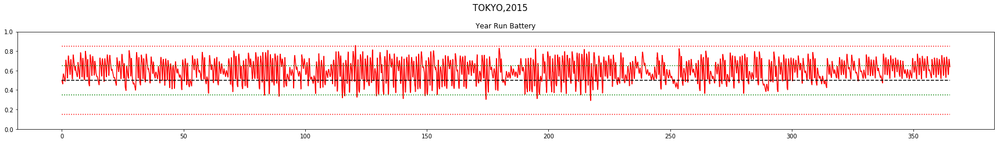



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


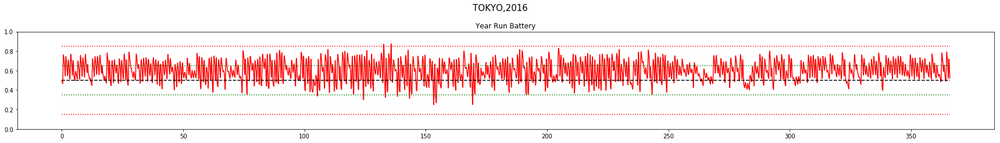



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


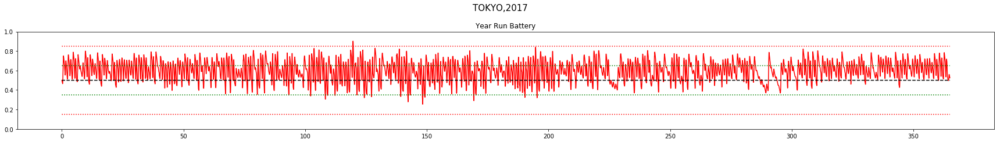



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


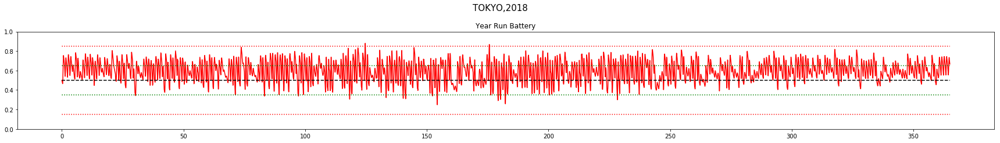



TOKYO
YEAR	AVG_RWD		VIOLATIONS	EMPTY	FULL
			DAY	BATT
2000	 1.99		0	 0	0	0
2001	 1.99		0	 0	0	0
2002	 1.99		0	 0	0	0
2003	 1.99		0	 0	0	0
2004	 1.99		0	 0	0	0
2005	 1.99		0	 0	0	0
2006	 1.99		0	 0	0	0
2007	 1.99		0	 0	0	0
2008	 1.99		0	 0	0	0
2009	 1.99		0	 0	0	0
2010	 1.99		0	 0	0	0
2011	 1.99		0	 0	0	0
2012	 1.99		0	 0	0	0
2013	 1.99		0	 0	0	0
2014	 1.99		0	 0	0	0
2015	 1.99		0	 0	0	0
2016	 1.99		0	 0	0	0
2017	 1.99		0	 0	0	0
2018	 1.99		0	 0	0	0

TOTAL Day  Violations:   0.0
TOTAL Batt  Violations:  0.0
TOTAL EMPTY Violations:  0.0
TOTAL FULL  Violations:  0.0
************************************


************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


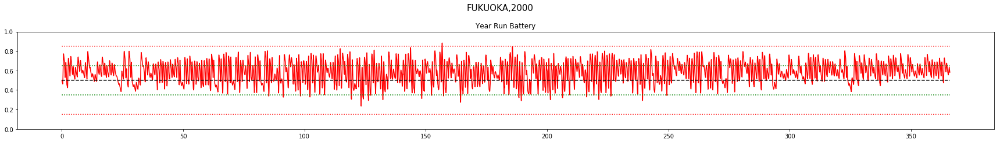



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


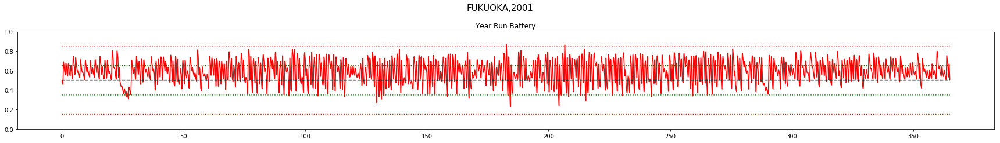



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


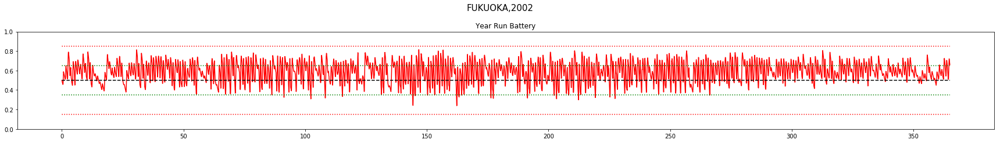



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


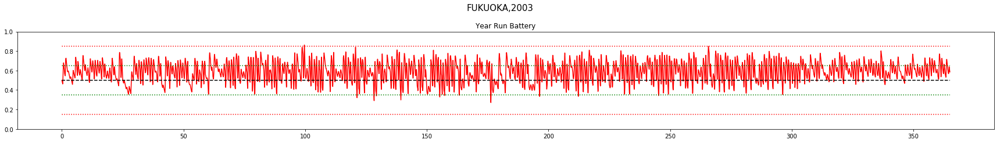



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


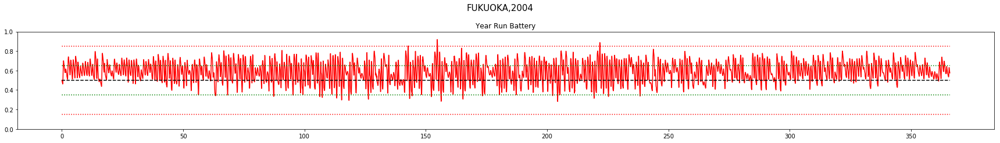



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


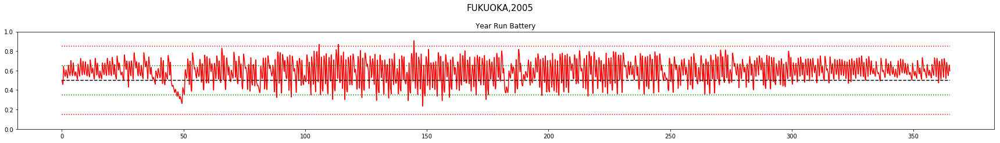



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


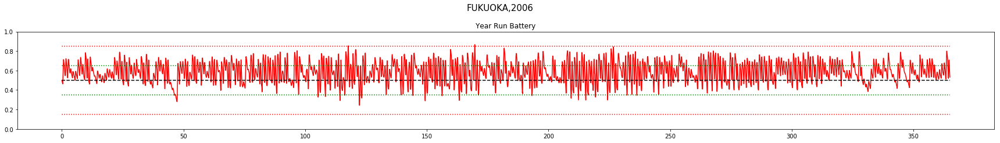



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


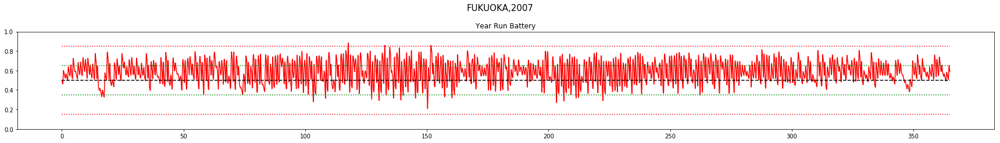



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


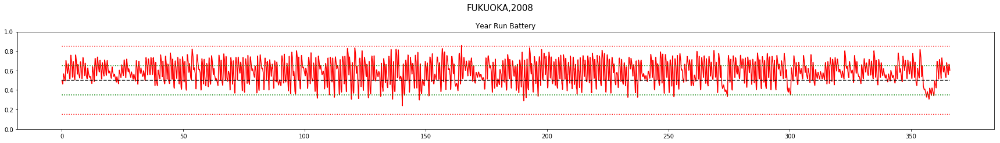



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


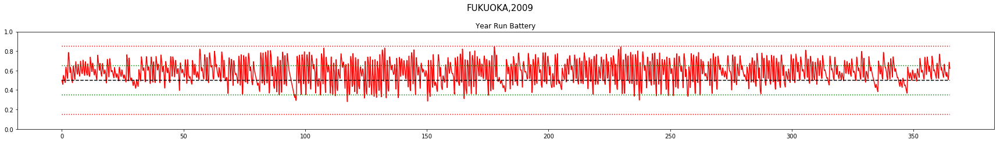



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


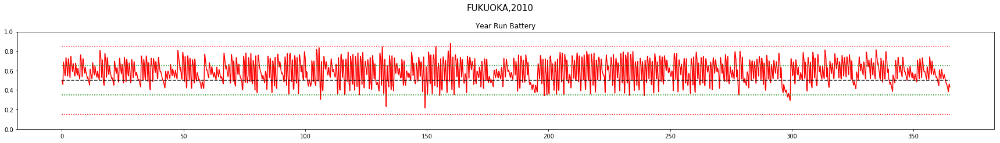



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


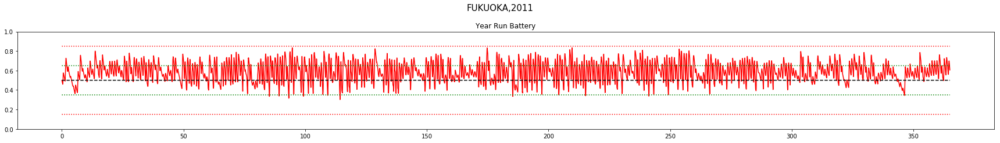



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


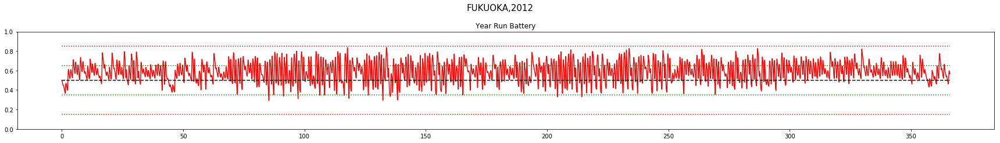



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


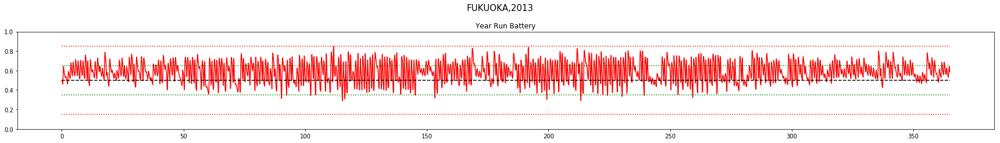



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


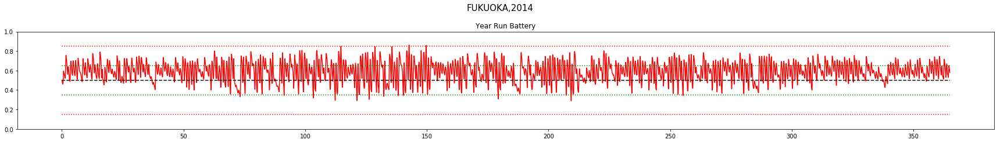



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


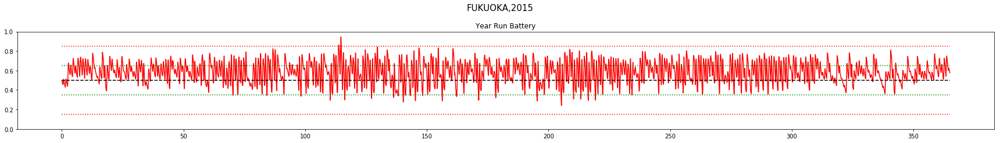



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


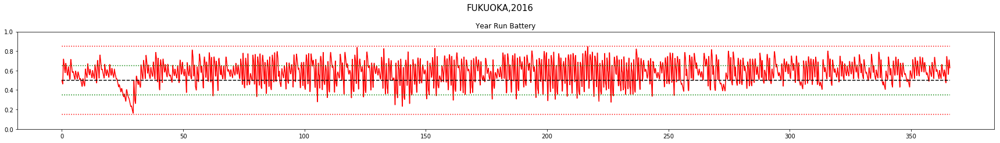



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


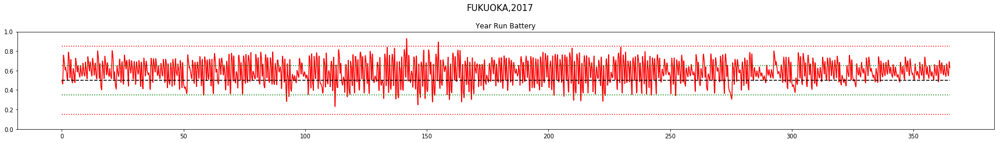



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


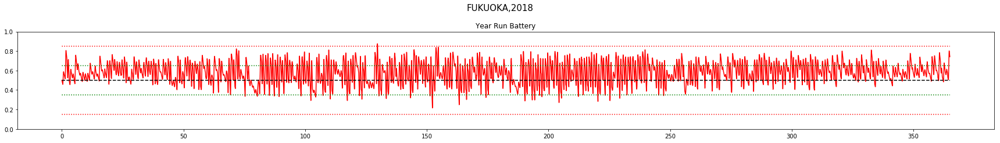



FUKUOKA
YEAR	AVG_RWD		VIOLATIONS	EMPTY	FULL
			DAY	BATT
2000	 1.99		0	 0	0	0
2001	 1.99		0	 0	0	0
2002	 1.99		0	 0	0	0
2003	 1.99		0	 0	0	0
2004	 1.99		0	 0	0	0
2005	 1.99		0	 0	0	0
2006	 1.99		0	 0	0	0
2007	 1.99		0	 0	0	0
2008	 1.99		0	 0	0	0
2009	 1.99		0	 0	0	0
2010	 1.99		0	 0	0	0
2011	 1.99		0	 0	0	0
2012	 1.99		0	 0	0	0
2013	 1.99		0	 0	0	0
2014	 1.99		0	 0	0	0
2015	 1.99		0	 0	0	0
2016	 1.99		0	 0	0	0
2017	 1.99		0	 0	0	0
2018	 1.99		0	 0	0	0

TOTAL Day  Violations:   0.0
TOTAL Batt  Violations:  0.0
TOTAL EMPTY Violations:  0.0
TOTAL FULL  Violations:  0.0
************************************


************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


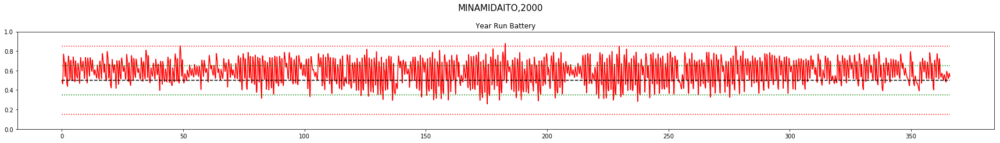



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


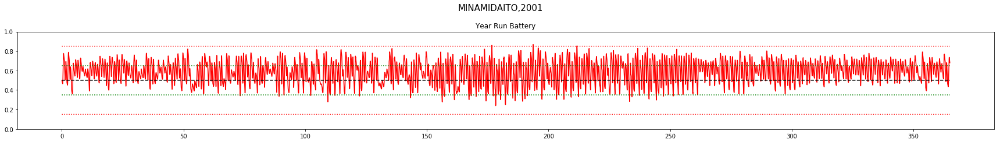



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


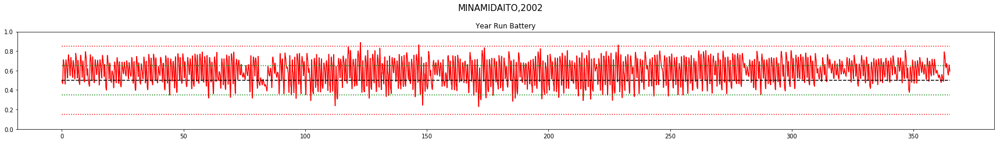



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


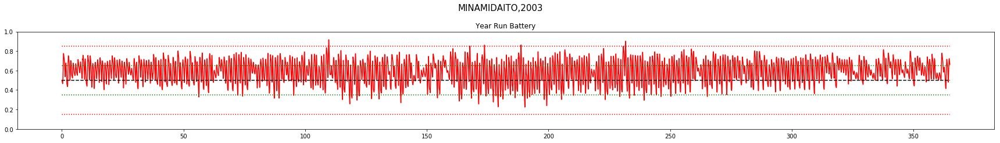



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


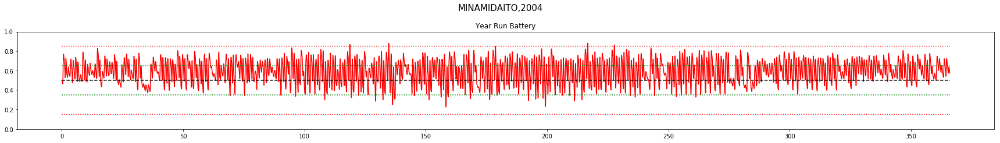



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


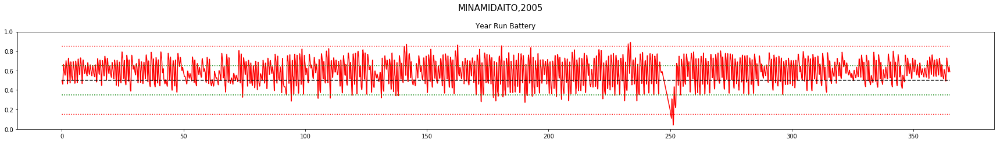



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


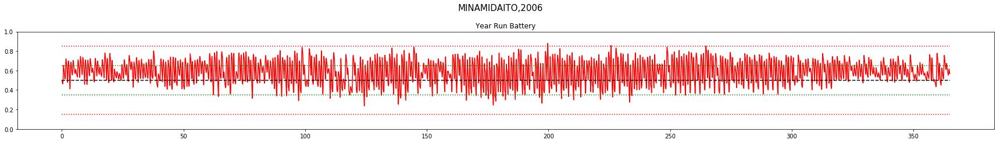



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


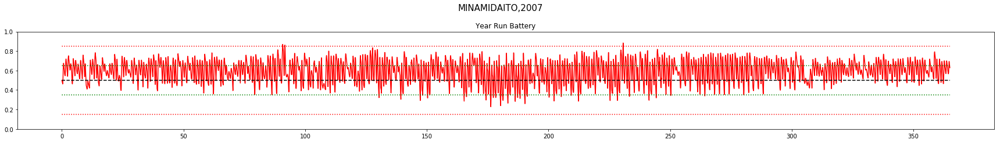



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


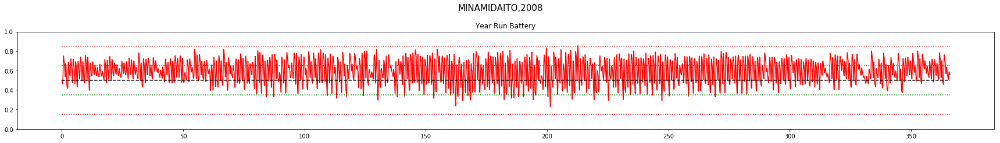



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


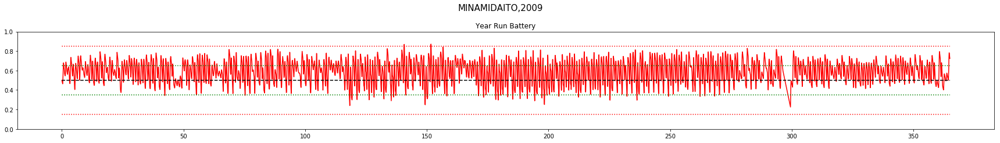



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


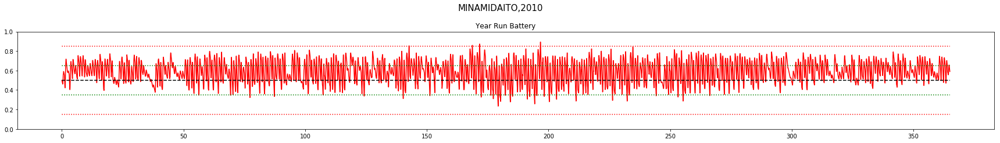



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


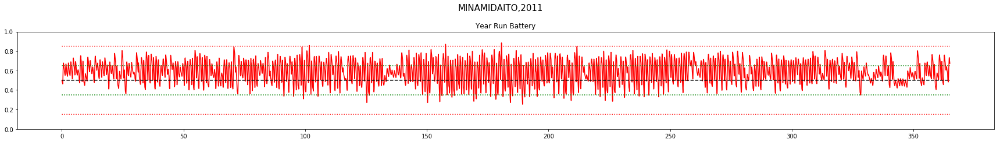



************************************
Day Violations           =      3
Battery Limit Violations =     34
Battery FULL Violations  =      0
Battery EMPTY Violations =     34


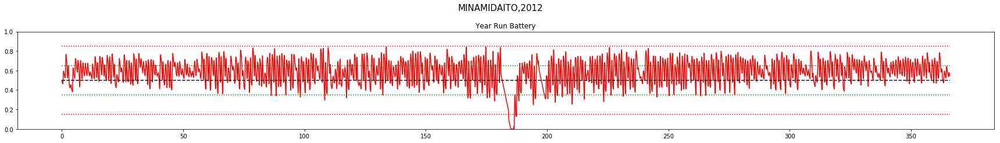



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


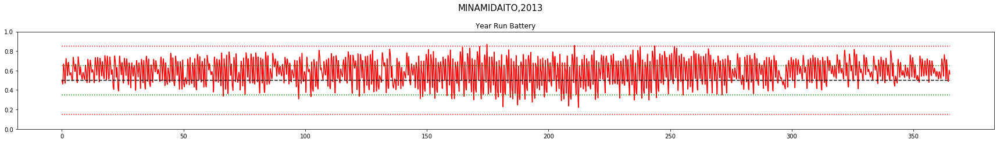



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


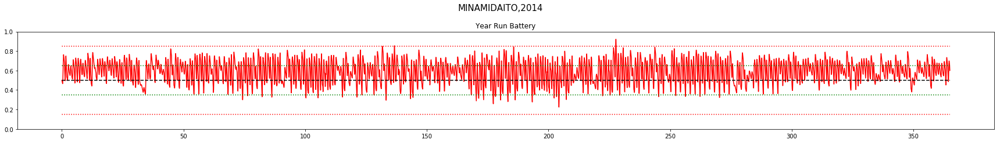



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


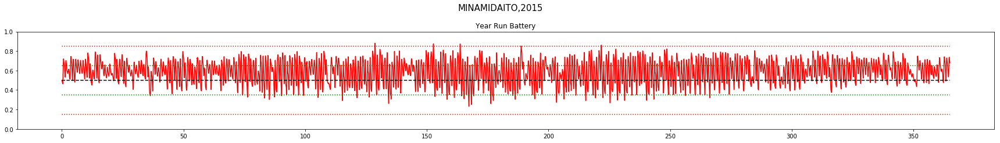



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


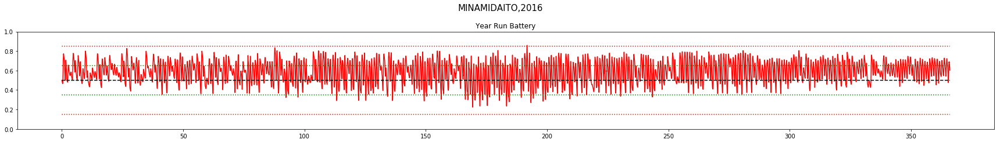



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


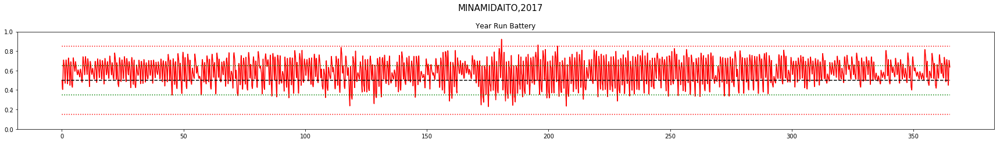



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


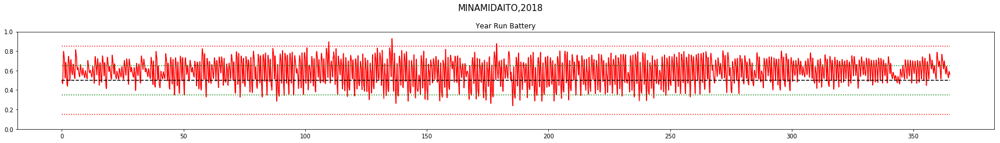



MINAMIDAITO
YEAR	AVG_RWD		VIOLATIONS	EMPTY	FULL
			DAY	BATT
2000	 1.99		0	 0	0	0
2001	 1.99		0	 0	0	0
2002	 1.99		0	 0	0	0
2003	 1.99		0	 0	0	0
2004	 1.99		0	 0	0	0
2005	 1.98		0	 0	0	0
2006	 1.99		0	 0	0	0
2007	 1.99		0	 0	0	0
2008	 1.99		0	 0	0	0
2009	 1.99		0	 0	0	0
2010	 1.99		0	 0	0	0
2011	 1.99		0	 0	0	0
2012	 1.94		3	 34	34	0
2013	 1.99		0	 0	0	0
2014	 1.99		0	 0	0	0
2015	 1.99		0	 0	0	0
2016	 1.99		0	 0	0	0
2017	 1.99		0	 0	0	0
2018	 1.99		0	 0	0	0

TOTAL Day  Violations:   3.0
TOTAL Batt  Violations:  34.0
TOTAL EMPTY Violations:  34.0
TOTAL FULL  Violations:  0.0
************************************


In [38]:
#VALIDATION PHASE
print("***MEASURING PERFORMANCE OF THE MODEL***")
for LOCATION in ['wakkanai','aomori','tokyo','fukuoka','minamidaito']:
    results = np.empty(6)
    for YEAR in np.arange(2000,2019):
        capm      = CAPM(LOCATION,YEAR,shuffle=False, trainmode=False) #instantiate the CAPM class
        capm.eno  = ENO(LOCATION,YEAR, shuffle=False, day_balance=False) #instantiate the environment inside the CAPM class
        capm.HMAX = capm.eno.SMAX #maximum power output of solar cell is set in CAPM object using the value in ENO object

        s, r, day_end, year_end = capm.reset()
        yr_test_record = np.empty(4)

        while True:
            a = dqn.choose_greedy_action(stdize(s))
            yr_test_record = np.vstack((yr_test_record, [s[0],s[2],r, a])) #record battery, henergy, reward and action
            s_, r, day_end, year_end = capm.step(a)
            if year_end:
                break
            s = s_

        yr_test_record = np.delete(yr_test_record, 0, 0) #remove the first row which is garbage
        yr_test_reward_rec = yr_test_record[:,2]
        yr_test_reward_rec = yr_test_reward_rec[::24] #annual average reward
        results = np.vstack((results, [int(YEAR), np.mean(yr_test_reward_rec), int(capm.violation_counter), int(capm.batt_violations), int(capm.batt_empty_counter), int(capm.batt_full_counter)]))
        print("\n\n************************************")
        print("Day Violations           = {:6d}".format(capm.violation_counter))
        print("Battery Limit Violations = {:6d}".format(capm.batt_violations))
        print("Battery FULL Violations  = {:6d}".format(capm.batt_full_counter))
        print("Battery EMPTY Violations = {:6d}".format(capm.batt_empty_counter))
    ###########################################################################################
    ###########################################################################################
        #     Plot the reward and battery for the entire year run
        title = LOCATION.upper() + ',' + str(YEAR)
        NO_OF_DAYS = capm.eno.NO_OF_DAYS

        fig = plt.figure(figsize=(24,6))
        fig.suptitle(title, fontsize=15)

    #         ax1 = fig.add_subplot(211)
    #         ax1.plot(yr_test_reward_rec)
    #         ax1.set_title("\n\nYear Run Reward")
    #         ax1.set_ylim([-4,2])

        ax2 = fig.add_subplot(211)
        ax2.plot(yr_test_record[:,0],'r')
        ax2.plot(np.ones_like(yr_test_record[:,0])*capm.BOPT/capm.BMAX, 'k--')
        ax2.plot(np.ones_like(yr_test_record[:,0])*capm.BLIM_LO/capm.BMAX, 'r:')
        ax2.plot(np.ones_like(yr_test_record[:,0])*capm.BLIM_HI/capm.BMAX, 'r:')
        ax2.plot(np.ones_like(yr_test_record[:,0])*(capm.BOPT+capm.ENP_MARGIN /2) /capm.BMAX, 'g:')
        ax2.plot(np.ones_like(yr_test_record[:,0])*(capm.BOPT-capm.ENP_MARGIN/2)/capm.BMAX, 'g:')

        ax2.set_title("\n\nYear Run Battery")
        ax2.set_ylim([0,1])
        plt.sca(ax2)
        plt.xticks(np.arange(0, NO_OF_DAYS*24, 50*24),np.arange(0,NO_OF_DAYS,50))
        fig.tight_layout()
        plt.show()
    ###########################################################################################
    ###########################################################################################


    results = np.delete(results,0,0)
    print("\n")
    print(LOCATION.upper())
    print('YEAR\tAVG_RWD\t\tVIOLATIONS\tEMPTY\tFULL')
    print('\t\t\tDAY\tBATT')

    for x in np.arange(0,results.shape[0]):
        print('{}\t {}\t\t{}\t {}\t{}\t{}'.format(int(results[x,0]), np.around(results[x,1],2), int(results[x,2]), int(results[x,3]), int(results[x,4]),  int(results[x,5]) ))

    print("\nTOTAL Day  Violations:  ",np.sum(results[:, 2]))
    print("TOTAL Batt  Violations: ",np.sum(results[:,3]))
    print("TOTAL EMPTY Violations: ",np.sum(results[:,4]))
    print("TOTAL FULL  Violations: ",np.sum(results[:,5]))
    print("************************************")